In [1]:
!nvidia-smi

Thu Sep 10 23:01:23 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   39C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import sys
import torch

print("Python:", sys.version)
print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

Python: 3.13.15 (main, Aug  6 2026, 11:06:22) [GCC 13.3.0]
PyTorch: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


In [3]:
!pip install -q librosa transformers datasets scikit-learn pandas numpy matplotlib seaborn tqdm pyyaml

In [4]:
!pip install -q torch-geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 75.4 MB/s eta 0:00:00


In [5]:
import torch_geometric

print("PyTorch Geometric:", torch_geometric.__version__)

PyTorch Geometric: 2.8.0.post1


In [6]:
import os
import json
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import librosa
import librosa.display

from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    f1_score,
    precision_score,
    recall_score,
    average_precision_score
)

from transformers import (
    AutoTokenizer,
    AutoModel
)

from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
from torch_geometric.nn import GraphSAGE, GATConv, global_mean_pool

print("All imports successful!")

All imports successful!


In [7]:
PROJECT_DIR = "/content/gnn-bert-music-context"

folders = [
    "data/raw",
    "data/processed",
    "data/graphs",
    "data/features",
    "data/splits",
    "notebooks",
    "src",
    "results/plots",
    "results/retrieval_examples",
    "report"
]

for folder in folders:
    os.makedirs(os.path.join(PROJECT_DIR, folder), exist_ok=True)

print("Project directory:", PROJECT_DIR)

for root, dirs, files in os.walk(PROJECT_DIR):
    level = root.replace(PROJECT_DIR, "").count(os.sep)
    indent = "    " * level
    print(f"{indent}{os.path.basename(root)}/")

Project directory: /content/gnn-bert-music-context
gnn-bert-music-context/
    report/
    notebooks/
    data/
        features/
        raw/
        graphs/
        processed/
        splits/
    src/
    results/
        plots/
        retrieval_examples/


In [8]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

print("Seed set to:", SEED)

Seed set to: 42


In [9]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Using device:", device)

if device.type == "cuda":
    print("GPU:", torch.cuda.get_device_name(0))
    print(
        "GPU memory:",
        round(torch.cuda.get_device_properties(0).total_memory / 1024**3, 2),
        "GB"
    )

Using device: cuda
GPU: Tesla T4
GPU memory: 14.56 GB


In [10]:
import os

DATA_DIR = "/content/gnn-bert-music-context/data/raw"
os.makedirs(DATA_DIR, exist_ok=True)

%cd $DATA_DIR

!wget -q --show-progress https://os.unil.ch/metadata/fma_metadata.zip #wwrong command

/content/gnn-bert-music-context/data/raw


In [11]:
!ls -lh

total 0


In [12]:
%cd /content/gnn-bert-music-context/data/raw

!wget -q --show-progress https://os.unil.cloud.switch.ch/fma/fma_metadata.zip #fixed it
!wget -q --show-progress https://os.unil.cloud.switch.ch/fma/fma_small.zip

!ls -lh

/content/gnn-bert-music-context/data/raw
fma_metadata.zip    100%[===================>] 341.81M  17.7MB/s    in 19s     
fma_small.zip       100%[===================>]   7.15G  22.9MB/s    in 5m 35s  
total 7.5G
-rw-r--r-- 1 root root 342M May  9  2017 fma_metadata.zip
-rw-r--r-- 1 root root 7.2G May  9  2017 fma_small.zip


In [13]:
!echo "f0df49ffe5f2a6008d7dc83c6915b31835dfe733  fma_metadata.zip" | sha1sum -c -
!echo "ade154f733639d52e35e32f5593efe5be76c6d70  fma_small.zip" | sha1sum -c -

fma_metadata.zip: OK
fma_small.zip: OK


In [14]:
!unzip -q fma_metadata.zip
!unzip -q fma_small.zip
!ls -lh

total 7.5G
drwxr-xr-x   2 root root 4.0K Sep 10 23:10 fma_metadata
-rw-r--r--   1 root root 342M May  9  2017 fma_metadata.zip
drwxr-xr-x 158 root root 4.0K Sep 10 23:21 fma_small
-rw-r--r--   1 root root 7.2G May  9  2017 fma_small.zip


In [15]:
import pandas as pd

METADATA_DIR = "/content/gnn-bert-music-context/data/raw/fma_metadata"

tracks = pd.read_csv(f"{METADATA_DIR}/tracks.csv", index_col=0, header=[0, 1])
genres = pd.read_csv(f"{METADATA_DIR}/genres.csv", index_col=0)

# filter to the small subset
small = tracks[tracks[('set', 'subset')] == 'small']
print(small.shape)
small[('track', 'genre_top')].value_counts()

(8000, 52)


,count
"(track, genre_top)",
Hip-Hop,1000
Pop,1000
Folk,1000
Experimental,1000
Rock,1000
International,1000
Electronic,1000
Instrumental,1000


In [16]:
#task1 buildup
text_cols = [c for c in tracks.columns if any(k in c[1].lower() for k in ['title', 'bio', 'tag', 'name'])]
print(text_cols)

small[text_cols].head(10)

[('album', 'tags'), ('album', 'title'), ('artist', 'bio'), ('artist', 'name'), ('artist', 'tags'), ('track', 'tags'), ('track', 'title')]


album                         \
          tags                  title   
track_id                                
2           []   AWOL - A Way Of Life   
5           []   AWOL - A Way Of Life   
10          []      Constant Hitmaker   
140         []         The Blind Spot   
141         []  Every Man For Himself   
148         []          Contradiction   
182         []              Worn Copy   
190         []             Blue Piano   
193         []             Blue Piano   
194         []             Blue Piano   

                                                     artist  \
                                                        bio   
track_id                                                      
2         <p>A Way Of Life, A Collective of Hip-Hop from...   
5         <p>A Way Of Life, A Collective of Hip-Hop from...   
10        <p><span style="font-family:Verdana, Geneva, A...   
140       <p>The Eyesores originally formed in 1997 orig...   
141       <p>The Eyesores originally formed in 1997 orig...   
148       <p>Power Electronics redefined by Andy Ortmann...   
182       <p>Ariel "Pink" Rosenberg has been churning ou...   
190       <p><i><span></span></i>Ed Askew cut one of the...   
193       <p><i><span></span></i>Ed Askew cut one of the...   
194       <p><i><span></span></i>Ed Askew cut one of the...   

                                           \
                                     name   
track_id                                    
2                                    AWOL   
5                                    AWOL   
10                              Kurt Vile   
140       Alec K. Redfearn & the Eyesores   
141       Alec K. Redfearn & the Eyesores   
148                         Contradiction   
182         Ariel Pink's Haunted Graffiti   
190                              Ed Askew   
193                              Ed Askew   
194                              Ed Askew   

                                               track                         
                                          tags  tags                  title  
track_id                                                                     
2                                     ['awol']    []                   Food  
5                                     ['awol']    []             This World  
10                     ['philly', 'kurt vile']    []                Freeway  
140       ['alec k redfearn and the eyesores']    []     Queen Of The Wires  
141       ['alec k redfearn and the eyesores']    []                   Ohio  
148                          ['contradiction']    []             Blackout 2  
182           ['ariel pinks haunted graffiti']    []  Jules Lost His Jewels  
190                               ['ed askew']    []        Castle Of Stars  
193                               ['ed askew']    []          Here With You  
194                               ['ed askew']    []       All I want to Do

In [17]:
# check official split column
print(tracks[('set', 'split')].value_counts())

# check artist leakage risk
artist_counts = small[('artist', 'name')].value_counts()
print(f"\nUnique artists in fma_small: {small[('artist','name')].nunique()}")
print(f"Tracks: {len(small)}")
print(artist_counts.head(10))

(set, split)
training      84353
test          11263
validation    10958
Name: count, dtype: int64

Unique artists in fma_small: 2306
Tracks: 8000
(artist, name)
Blue Dot Sessions    208
Big Blood             91
The Impossebulls      68
Squire Tuck           56
Kellee Maize          55
Ergo Phizmiz          54
TRG Banks             47
Derek Clegg           45
Jahzzar               44
C-Doc                 42
Name: count, dtype: int64


In [18]:
small = small.copy()
small['split'] = tracks.loc[small.index, ('set', 'split')]
small['artist_name'] = tracks.loc[small.index, ('artist', 'name')]

train_artists = set(small[small['split'] == 'training']['artist_name'])
val_artists   = set(small[small['split'] == 'validation']['artist_name'])
test_artists  = set(small[small['split'] == 'test']['artist_name'])

print("split sizes:", small['split'].value_counts().to_dict())
print("train∩val artists:", len(train_artists & val_artists))
print("train∩test artists:", len(train_artists & test_artists))
print("val∩test artists:", len(val_artists & test_artists))

split sizes: {'training': 6400, 'validation': 800, 'test': 800}
train∩val artists: 0
train∩test artists: 0
val∩test artists: 0


In [19]:
#building the text field and labels for Task 1
#step 1 of task1 cleaning the bio and combined text field
import re

def clean_html(raw):
    if pd.isna(raw):
        return ""
    return re.sub(r'<[^>]+>', ' ', str(raw)).strip()

small['bio_clean'] = tracks.loc[small.index, ('artist', 'bio')].apply(clean_html)
small['album_title'] = tracks.loc[small.index, ('album', 'title')].fillna("")
small['track_title'] = tracks.loc[small.index, ('track', 'title')].fillna("")

small['text'] = (
    small['track_title'] + " by " +
    small['artist_name'] + ". Album: " +
    small['album_title'] + ". " +
    small['bio_clean']
)

small['text'] = small['text'].str.strip()

# sanity check
print(small['text'].str.len().describe())
small[['text']].head(3)

count    8000.000000
mean      583.853375
std       701.262205
min        25.000000
25%        91.000000
50%       392.000000
75%       726.250000
max      8976.000000
Name: text, dtype: float64


,text
,
track_id,
2,Food by AWOL. Album: AWOL - A Way Of Life. A W...
5,This World by AWOL. Album: AWOL - A Way Of Lif...
10,Freeway by Kurt Vile. Album: Constant Hitmaker...


In [20]:
#building the label (genre_top, encoded as integer class for now — single-label 8-class, which treat as a multi-label-style BCE task per the spec by one-hot encoding)
#step2 task1
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
small['genre_label'] = le.fit_transform(small[('track', 'genre_top')])

print(dict(zip(le.classes_, range(len(le.classes_)))))
small['genre_label'].value_counts()

{'Electronic': 0, 'Experimental': 1, 'Folk': 2, 'Hip-Hop': 3, 'Instrumental': 4, 'International': 5, 'Pop': 6, 'Rock': 7}


,count
genre_label,
3,1000
6,1000
2,1000
1,1000
7,1000
5,1000
0,1000
4,1000


In [21]:
#step 3 task 1 spliting into train/val/test using the official split, then tokenize:
train_df = small[small['split'] == 'training'].reset_index(drop=True)
val_df   = small[small['split'] == 'validation'].reset_index(drop=True)
test_df  = small[small['split'] == 'test'].reset_index(drop=True)

print(len(train_df), len(val_df), len(test_df))

6400 800 800


In [22]:
#step 4 task 1 building a PyTorch Dataset with BERT tokenization:
from torch.utils.data import Dataset, DataLoader as TorchDataLoader

MODEL_NAME = "distilbert-base-uncased"
MAX_LEN = 256

tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

class TagTextDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=MAX_LEN):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        enc = self.tokenizer(
            self.texts[idx],
            truncation=True,
            padding="max_length",
            max_length=self.max_len,
            return_tensors="pt"
        )
        return {
            "input_ids": enc["input_ids"].squeeze(0),
            "attention_mask": enc["attention_mask"].squeeze(0),
            "label": torch.tensor(self.labels[idx], dtype=torch.long)
        }

train_ds = TagTextDataset(train_df['text'].tolist(), train_df['genre_label'].tolist(), tokenizer)
val_ds   = TagTextDataset(val_df['text'].tolist(), val_df['genre_label'].tolist(), tokenizer)
test_ds  = TagTextDataset(test_df['text'].tolist(), test_df['genre_label'].tolist(), tokenizer)

BATCH_SIZE = 16
train_loader = TorchDataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = TorchDataLoader(val_ds, batch_size=BATCH_SIZE)
test_loader  = TorchDataLoader(test_ds, batch_size=BATCH_SIZE)

print("Batches:", len(train_loader), len(val_loader), len(test_loader))

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Batches: 400 50 50


In [23]:
#Step 5 task 1 — model class (BERT + classification head):
class BertTagClassifier(nn.Module):
    def __init__(self, model_name=MODEL_NAME, num_classes=8, dropout=0.3):
        super().__init__()
        self.bert = AutoModel.from_pretrained(model_name)
        hidden_size = self.bert.config.hidden_size
        self.dropout = nn.Dropout(dropout)
        self.classifier = nn.Linear(hidden_size, num_classes)

    def forward(self, input_ids, attention_mask):
        out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        cls_token = out.last_hidden_state[:, 0, :]  # CLS token, t = BERT_CLS(X_text)
        cls_token = self.dropout(cls_token)
        logits = self.classifier(cls_token)  # Wt + b
        return logits

model = BertTagClassifier().to(device)
print(sum(p.numel() for p in model.parameters() if p.requires_grad), "trainable params")

model.safetensors: reconstructing file:   0%|          |  0.00B /  268MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

[transformers] DistilBertModel LOAD REPORT from: distilbert-base-uncased
Key                     | Status     |  | 
------------------------+------------+--+-
vocab_transform.weight  | UNEXPECTED |  | 
vocab_layer_norm.weight | UNEXPECTED |  | 
vocab_projector.bias    | UNEXPECTED |  | 
vocab_transform.bias    | UNEXPECTED |  | 
vocab_layer_norm.bias   | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


66369032 trainable params


In [24]:
#Step 6 task1 — training loop with Macro-F1/Micro-F1 tracking per epoch
from torch.optim import AdamW

optimizer = AdamW(model.parameters(), lr=2e-5)
criterion = nn.CrossEntropyLoss()  # single-label genre_top; note in report this substitutes multi-label BCE per FMA's tag sparsity

EPOCHS = 4
history = {"train_loss": [], "val_macro_f1": [], "val_micro_f1": []}

def evaluate(loader):
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for batch in loader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)
            logits = model(input_ids, attention_mask)
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    macro_f1 = f1_score(all_labels, all_preds, average="macro")
    micro_f1 = f1_score(all_labels, all_preds, average="micro")
    return macro_f1, micro_f1, all_preds, all_labels

for epoch in range(EPOCHS):
    model.train()
    total_loss = 0
    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["label"].to(device)

        optimizer.zero_grad()
        logits = model(input_ids, attention_mask)
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    avg_loss = total_loss / len(train_loader)
    val_macro_f1, val_micro_f1, _, _ = evaluate(val_loader)

    history["train_loss"].append(avg_loss)
    history["val_macro_f1"].append(val_macro_f1)
    history["val_micro_f1"].append(val_micro_f1)

    print(f"Epoch {epoch+1}: loss={avg_loss:.4f}  val_macro_f1={val_macro_f1:.4f}  val_micro_f1={val_micro_f1:.4f}")

Epoch 1:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 1: loss=1.0426  val_macro_f1=0.4943  val_micro_f1=0.4850


Epoch 2:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 2: loss=0.3481  val_macro_f1=0.4673  val_micro_f1=0.4725


Epoch 3:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 3: loss=0.1593  val_macro_f1=0.5220  val_micro_f1=0.5088


Epoch 4:   0%|          | 0/400 [00:00<?, ?it/s]

Epoch 4: loss=0.0906  val_macro_f1=0.5916  val_micro_f1=0.5913


In [25]:
clean = pd.DataFrame({
    "text": small["text"].values,
    "genre_label": small["genre_label"].values,
    "split": small["split"].values,
}, index=small.index)

train_df = clean[clean['split'] == 'training'].reset_index(drop=True)
val_df   = clean[clean['split'] == 'validation'].reset_index(drop=True)
test_df  = clean[clean['split'] == 'test'].reset_index(drop=True)

print(len(train_df), len(val_df), len(test_df))

6400 800 800


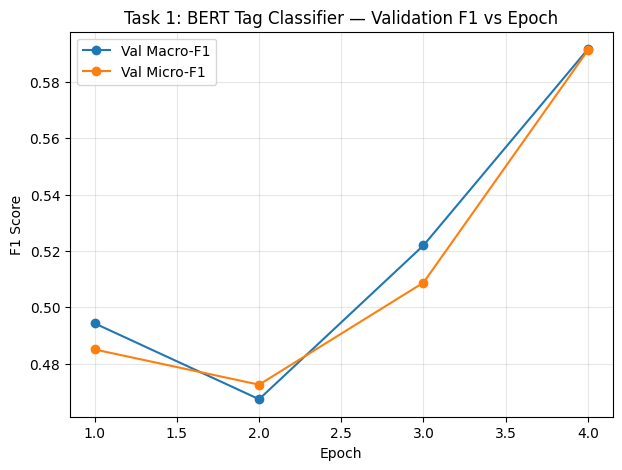

In [26]:
#step 7 task1 plotting F1 curves over epochs:
plt.figure(figsize=(7,5))
epochs_range = range(1, EPOCHS+1)
plt.plot(epochs_range, history["val_macro_f1"], marker='o', label="Val Macro-F1")
plt.plot(epochs_range, history["val_micro_f1"], marker='o', label="Val Micro-F1")
plt.xlabel("Epoch")
plt.ylabel("F1 Score")
plt.title("Task 1: BERT Tag Classifier — Validation F1 vs Epoch")
plt.legend()
plt.grid(alpha=0.3)
plt.savefig("/content/gnn-bert-music-context/results/plots/task1_f1_curves.png", dpi=150, bbox_inches="tight")
plt.show()

In [27]:
#Step 8 task 1 final test set evaluation
test_macro_f1, test_micro_f1, test_preds, test_labels = evaluate(test_loader)
test_precision = precision_score(test_labels, test_preds, average="macro")
test_recall = recall_score(test_labels, test_preds, average="macro")

print(f"TEST — Macro-F1: {test_macro_f1:.4f}  Micro-F1: {test_micro_f1:.4f}")
print(f"TEST — Macro-Precision: {test_precision:.4f}  Macro-Recall: {test_recall:.4f}")

TEST — Macro-F1: 0.5319  Micro-F1: 0.5537
TEST — Macro-Precision: 0.5536  Macro-Recall: 0.5537


In [28]:
#Step 9 task 1 5 example predictions
model.eval()
sample_idx = np.random.choice(len(test_df), 5, replace=False)

for i in sample_idx:
    text = test_df.iloc[i]['text']
    true_label = le.classes_[test_df.iloc[i]['genre_label']]

    enc = tokenizer(text, truncation=True, padding="max_length", max_length=MAX_LEN, return_tensors="pt").to(device)
    with torch.no_grad():
        logits = model(enc["input_ids"], enc["attention_mask"])
        pred_label = le.classes_[torch.argmax(logits, dim=1).item()]

    print(f"True: {true_label:15s} | Pred: {pred_label:15s} | Text: {text[:100]}...")
    print("-"*100)

True: Rock            | Pred: Instrumental    | Text: The Bitten by The Sun Through A Telescope. Album: I Die Smiling. THE SUN THROUGH A TELESCOPE  is a o...
----------------------------------------------------------------------------------------------------
True: Instrumental    | Pred: International   | Text: Love will Conquer All by Squire Tuck. Album: Jamstik Jams....
----------------------------------------------------------------------------------------------------
True: Hip-Hop         | Pred: Pop             | Text: Steppin' In by Audible Intelligence. Album: netBloc Vol. 20: music to accompany the world traveller....
----------------------------------------------------------------------------------------------------
True: Hip-Hop         | Pred: Hip-Hop         | Text: For More Years (Instrumental) by The Impossebulls. Album: Slave Education XE. In 1998, Hip Hop visio...
----------------------------------------------------------------------------------------------------
True: 

In [29]:
#step 10 task 1 saving metrics + predictions to results/
import json

metrics = {
    "task": "Task 1: BERT Tag/Genre Classifier",
    "model": MODEL_NAME,
    "epochs": EPOCHS,
    "history": history,
    "test_macro_f1": test_macro_f1,
    "test_micro_f1": test_micro_f1,
    "test_macro_precision": test_precision,
    "test_macro_recall": test_recall,
}

with open("/content/gnn-bert-music-context/results/task1_metrics.json", "w") as f:
    json.dump(metrics, f, indent=2)

print("Saved metrics.")

Saved metrics.


In [30]:
#step 11 saving the model weights
torch.save(model.state_dict(), "/content/gnn-bert-music-context/results/task1_bert_model.pt")
print("Model saved.")

Model saved.


In [31]:
#task2
#step1 — build the balanced subsample with audio paths:
import librosa
import numpy as np

N_PER_GENRE = 250  # ~250*8 = 2000 tracks total

clean['genre_top'] = tracks.loc[small.index, ('track', 'genre_top')].values
clean['track_id'] = small.index

def track_id_to_path(track_id):
    tid_str = f"{track_id:06d}"
    return f"/content/gnn-bert-music-context/data/raw/fma_small/{tid_str[:3]}/{tid_str}.mp3"

clean['audio_path'] = clean['track_id'].apply(track_id_to_path)

sampled = (
    clean.groupby('genre_top', group_keys=False)
    .apply(lambda g: g.sample(n=min(N_PER_GENRE, len(g)), random_state=SEED))
    .reset_index(drop=True)
)

print(sampled['genre_top'].value_counts())
print(sampled['split'].value_counts())

genre_top
Electronic       250
Experimental     250
Folk             250
Hip-Hop          250
Instrumental     250
International    250
Pop              250
Rock             250
Name: count, dtype: int64
split
training      1578
validation     222
test           200
Name: count, dtype: int64


/tmp/ipykernel_4380/3547955802.py:19: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.sample(n=min(N_PER_GENRE, len(g)), random_state=SEED))


In [32]:
#task2
#step2—quick sanity check that files actually exist and load
import os

missing = 0
broken = 0
for path in sampled['audio_path'].head(20):
    if not os.path.exists(path):
        missing += 1
        continue
    try:
        y, sr = librosa.load(path, sr=22050, duration=1.0)
    except Exception as e:
        broken += 1

print(f"Checked 20 files — missing: {missing}, broken: {broken}")


Checked 20 files — missing: 0, broken: 0


In [33]:
#task 2 step 3 chrome extraction function
SR = 22050
SEGMENT_SEC = 5.0
MAX_DURATION = 30.0  # FMA-small clips are ~30s; cap to keep this bounded

def extract_segment_chroma(path, sr=SR, segment_sec=SEGMENT_SEC, max_duration=MAX_DURATION):
    try:
        y, _ = librosa.load(path, sr=sr, duration=max_duration)
    except Exception:
        return None

    if len(y) < sr:  # too short to be usable
        return None

    seg_len = int(segment_sec * sr)
    n_segments = len(y) // seg_len
    if n_segments < 2:  # need at least 2 nodes for a graph
        return None

    segment_features = []
    for i in range(n_segments):
        seg = y[i * seg_len : (i + 1) * seg_len]
        chroma = librosa.feature.chroma_stft(y=seg, sr=sr)
        chroma_mean = chroma.mean(axis=1)  # 12-dim, averaged over time
        segment_features.append(chroma_mean)

    return np.stack(segment_features)  # shape: (n_segments, 12)

# quick test on one file
test_feat = extract_segment_chroma(sampled['audio_path'].iloc[0])
print("Shape:", test_feat.shape if test_feat is not None else None)

Shape: (6, 12)


In [34]:
#Step 4 — build graph for one track (nodes = segments, edges = temporal + similarity):
from sklearn.metrics.pairwise import cosine_similarity

SIM_THRESHOLD = 0.9  # cosine similarity threshold for extra edges

def build_segment_graph(chroma_feats, label, sim_threshold=SIM_THRESHOLD):
    n = chroma_feats.shape[0]
    x = torch.tensor(chroma_feats, dtype=torch.float)

    edge_list = []

    # temporal adjacency: i <-> i+1
    for i in range(n - 1):
        edge_list.append([i, i + 1])
        edge_list.append([i + 1, i])

    # similarity edges: cosine sim > threshold (excluding self and already-adjacent)
    sim_matrix = cosine_similarity(chroma_feats)
    for i in range(n):
        for j in range(i + 1, n):
            if j != i + 1 and sim_matrix[i, j] > sim_threshold:
                edge_list.append([i, j])
                edge_list.append([j, i])

    edge_index = torch.tensor(edge_list, dtype=torch.long).t().contiguous()

    y = torch.tensor([label], dtype=torch.long)

    return Data(x=x, edge_index=edge_index, y=y)

# test on the same file
test_graph = build_segment_graph(test_feat, label=0)
print(test_graph)
print("Num nodes:", test_graph.num_nodes, "Num edges:", test_graph.num_edges)

Data(x=[6, 12], edge_index=[2, 30], y=[1])
Num nodes: 6 Num edges: 30


In [35]:
#task 2 Step 5 — full extraction loop (this is the slow part, ~10–15 min for 2000 tracks):
graphs = []
labels_used = []
failed = 0

genre_to_idx = {g: i for i, g in enumerate(sorted(sampled['genre_top'].unique()))}
print(genre_to_idx)

for idx, row in tqdm(sampled.iterrows(), total=len(sampled)):
    chroma_feat = extract_segment_chroma(row['audio_path'])
    if chroma_feat is None:
        failed += 1
        continue

    label = genre_to_idx[row['genre_top']]
    graph = build_segment_graph(chroma_feat, label)
    graph.split = row['split']  # tag for later splitting
    graph.track_id = row['track_id']
    graphs.append(graph)

print(f"\nBuilt {len(graphs)} graphs, {failed} failed/skipped")

{'Electronic': 0, 'Experimental': 1, 'Folk': 2, 'Hip-Hop': 3, 'Instrumental': 4, 'International': 5, 'Pop': 6, 'Rock': 7}


  0%|          | 0/2000 [00:00<?, ?it/s]

/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: Use


Built 1999 graphs, 1 failed/skipped


In [36]:
#task2 Step 6 — split graphs and save example graphs to disk:
train_graphs = [g for g in graphs if g.split == 'training']
val_graphs   = [g for g in graphs if g.split == 'validation']
test_graphs  = [g for g in graphs if g.split == 'test']

print(f"Train: {len(train_graphs)}  Val: {len(val_graphs)}  Test: {len(test_graphs)}")

# save 25 example graphs as required deliverable
GRAPH_DIR = "/content/gnn-bert-music-context/data/graphs"
os.makedirs(GRAPH_DIR, exist_ok=True)

for i, g in enumerate(graphs[:25]):
    torch.save(g, f"{GRAPH_DIR}/example_graph_{i:02d}_track{g.track_id}.pt")

print("Saved 25 example graphs to", GRAPH_DIR)

# also save the full graph list for training (so we don't need to re-extract if runtime hiccups)
torch.save(graphs, f"{GRAPH_DIR}/all_graphs.pt")
print("Saved full graph set.")

Train: 1577  Val: 222  Test: 200
Saved 25 example graphs to /content/gnn-bert-music-context/data/graphs
Saved full graph set.


In [37]:
#task 2 step 7
from torch_geometric.loader import DataLoader as PyGDataLoader

GRAPH_BATCH_SIZE = 32

train_graph_loader = PyGDataLoader(train_graphs, batch_size=GRAPH_BATCH_SIZE, shuffle=True)
val_graph_loader   = PyGDataLoader(val_graphs, batch_size=GRAPH_BATCH_SIZE)
test_graph_loader  = PyGDataLoader(test_graphs, batch_size=GRAPH_BATCH_SIZE)

print("Batches:", len(train_graph_loader), len(val_graph_loader), len(test_graph_loader))

Batches: 50 7 7


In [38]:
#task 2 Step 8 — GraphSAGE model class:
class GraphSAGEClassifier(nn.Module):
    def __init__(self, in_channels=12, hidden_channels=64, num_layers=3, num_classes=8, dropout=0.3):
        super().__init__()
        self.sage = GraphSAGE(
            in_channels=in_channels,
            hidden_channels=hidden_channels,
            num_layers=num_layers,
            dropout=dropout,
        )
        self.classifier = nn.Linear(hidden_channels, num_classes)

    def forward(self, x, edge_index, batch):
        h = self.sage(x, edge_index)          # node embeddings after L layers
        g = global_mean_pool(h, batch)        # mean-pool readout -> graph embedding
        logits = self.classifier(g)           # Wg + b
        return logits

gnn_model = GraphSAGEClassifier().to(device)
print(sum(p.numel() for p in gnn_model.parameters() if p.requires_grad), "trainable params")

18632 trainable params


In [39]:
#task 2 Step 9 — training loop (mirrors Task 1's structure for consistent reporting):
gnn_optimizer = AdamW(gnn_model.parameters(), lr=1e-3)
gnn_criterion = nn.CrossEntropyLoss()

GNN_EPOCHS = 30
gnn_history = {"train_loss": [], "val_macro_f1": [], "val_micro_f1": []}

def evaluate_gnn(loader):
    gnn_model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for batch in loader:
            batch = batch.to(device)
            logits = gnn_model(batch.x, batch.edge_index, batch.batch)
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(batch.y.cpu().numpy())
    macro_f1 = f1_score(all_labels, all_preds, average="macro")
    micro_f1 = f1_score(all_labels, all_preds, average="micro")
    return macro_f1, micro_f1

for epoch in range(GNN_EPOCHS):
    gnn_model.train()
    total_loss = 0
    for batch in train_graph_loader:
        batch = batch.to(device)
        gnn_optimizer.zero_grad()
        logits = gnn_model(batch.x, batch.edge_index, batch.batch)
        loss = gnn_criterion(logits, batch.y)
        loss.backward()
        gnn_optimizer.step()
        total_loss += loss.item()

    avg_loss = total_loss / len(train_graph_loader)
    val_macro_f1, val_micro_f1 = evaluate_gnn(val_graph_loader)

    gnn_history["train_loss"].append(avg_loss)
    gnn_history["val_macro_f1"].append(val_macro_f1)
    gnn_history["val_micro_f1"].append(val_micro_f1)

    if (epoch + 1) % 5 == 0 or epoch == 0:
        print(f"Epoch {epoch+1}: loss={avg_loss:.4f}  val_macro_f1={val_macro_f1:.4f}  val_micro_f1={val_micro_f1:.4f}")

Epoch 1: loss=2.0757  val_macro_f1=0.1149  val_micro_f1=0.1486
Epoch 5: loss=1.9134  val_macro_f1=0.2017  val_micro_f1=0.2342
Epoch 10: loss=1.8600  val_macro_f1=0.2518  val_micro_f1=0.2838
Epoch 15: loss=1.8130  val_macro_f1=0.2272  val_micro_f1=0.2568
Epoch 20: loss=1.7632  val_macro_f1=0.2395  val_micro_f1=0.2523
Epoch 25: loss=1.7274  val_macro_f1=0.2715  val_micro_f1=0.2838
Epoch 30: loss=1.7010  val_macro_f1=0.2926  val_micro_f1=0.2973


GNN TEST — Macro-F1: 0.2408  Micro-F1: 0.2650


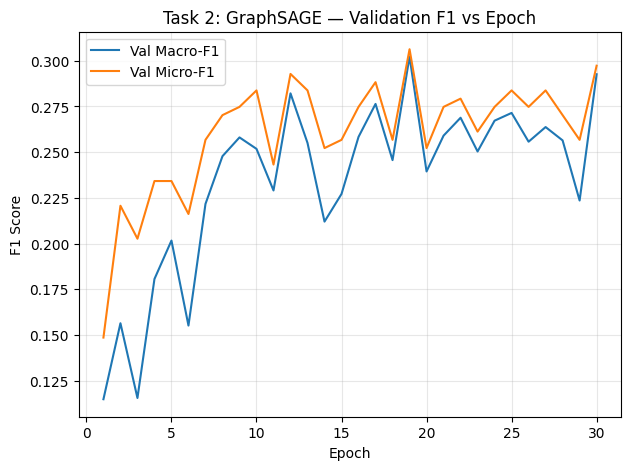

In [40]:
#task 2 Step 10 — final GNN test evaluation + save results:
gnn_test_macro_f1, gnn_test_micro_f1 = evaluate_gnn(test_graph_loader)
print(f"GNN TEST — Macro-F1: {gnn_test_macro_f1:.4f}  Micro-F1: {gnn_test_micro_f1:.4f}")

gnn_metrics = {
    "task": "Task 2: GraphSAGE on Segment Chroma Graphs",
    "epochs": GNN_EPOCHS,
    "history": gnn_history,
    "test_macro_f1": gnn_test_macro_f1,
    "test_micro_f1": gnn_test_micro_f1,
}

with open("/content/gnn-bert-music-context/results/task2_gnn_metrics.json", "w") as f:
    json.dump(gnn_metrics, f, indent=2)

torch.save(gnn_model.state_dict(), "/content/gnn-bert-music-context/results/task2_gnn_model.pt")

plt.figure(figsize=(7,5))
plt.plot(range(1, GNN_EPOCHS+1), gnn_history["val_macro_f1"], label="Val Macro-F1")
plt.plot(range(1, GNN_EPOCHS+1), gnn_history["val_micro_f1"], label="Val Micro-F1")
plt.xlabel("Epoch")
plt.ylabel("F1 Score")
plt.title("Task 2: GraphSAGE — Validation F1 vs Epoch")
plt.legend()
plt.grid(alpha=0.3)
plt.savefig("/content/gnn-bert-music-context/results/plots/task2_f1_curves.png", dpi=150, bbox_inches="tight")
plt.show()

In [41]:
#task 2 Step 11 — mel-spectrogram extraction (fixed-size, so it can go straight into a CNN):
N_MELS = 64
FIXED_FRAMES = 130  # ~ corresponds to ~3s at hop_length=512, sr=22050; we'll pad/crop to this

def extract_melspec(path, sr=SR, n_mels=N_MELS, fixed_frames=FIXED_FRAMES, duration=MAX_DURATION):
    try:
        y, _ = librosa.load(path, sr=sr, duration=duration)
    except Exception:
        return None
    if len(y) < sr:
        return None

    mel = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels)
    mel_db = librosa.power_to_db(mel, ref=np.max)

    # pad or crop time axis to fixed_frames
    if mel_db.shape[1] < fixed_frames:
        pad_width = fixed_frames - mel_db.shape[1]
        mel_db = np.pad(mel_db, ((0,0),(0,pad_width)), mode='constant', constant_values=mel_db.min())
    else:
        mel_db = mel_db[:, :fixed_frames]

    return mel_db  # shape: (n_mels, fixed_frames)

test_mel = extract_melspec(sampled['audio_path'].iloc[0])
print("Shape:", test_mel.shape)

Shape: (64, 130)


In [42]:
#task 2 Step 12 — full mel-spec extraction (reuses the same sampled tracks/labels for a fair, apples-to-apples comparison with the GNN):
mel_specs = []
mel_labels = []
mel_splits = []
failed_mel = 0

for idx, row in tqdm(sampled.iterrows(), total=len(sampled)):
    mel = extract_melspec(row['audio_path'])
    if mel is None:
        failed_mel += 1
        continue
    mel_specs.append(mel)
    mel_labels.append(genre_to_idx[row['genre_top']])
    mel_splits.append(row['split'])

mel_specs = np.stack(mel_specs)  # (N, 64, 130)
mel_labels = np.array(mel_labels)
mel_splits = np.array(mel_splits)

print(f"Built {len(mel_specs)} mel-specs, {failed_mel} failed")
print("Mel array shape:", mel_specs.shape)

# save for reproducibility
np.save("/content/gnn-bert-music-context/data/features/mel_specs.npy", mel_specs)
np.save("/content/gnn-bert-music-context/data/features/mel_labels.npy", mel_labels)
np.save("/content/gnn-bert-music-context/data/features/mel_splits.npy", mel_splits)

  0%|          | 0/2000 [00:00<?, ?it/s]

/tmp/ipykernel_4380/3611731596.py:7: UserWarning: PySoundFile failed. Trying audioread instead.
  y, _ = librosa.load(path, sr=sr, duration=duration)
/usr/local/lib/python3.13/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Built 1999 mel-specs, 1 failed
Mel array shape: (1999, 64, 130)


In [43]:
#task 2 Step 13 — CNN model (simple 2D conv stack over mel-spectrograms, standard baseline architecture):
class MelCNN(nn.Module):
    def __init__(self, num_classes=8):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d((4, 4)),
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 4 * 4, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes),
        )

    def forward(self, x):
        x = self.conv(x)
        return self.classifier(x)

cnn_model = MelCNN().to(device)
print(sum(p.numel() for p in cnn_model.parameters() if p.requires_grad), "trainable params")

155752 trainable params


In [44]:
#task 2 Step 14 — build tensors/dataloaders and normalize:
from torch.utils.data import TensorDataset

# normalize mel specs (z-score using train stats only, avoid leakage)
train_mask = mel_splits == 'training'
mel_mean = mel_specs[train_mask].mean()
mel_std = mel_specs[train_mask].std()

mel_specs_norm = (mel_specs - mel_mean) / mel_std
mel_tensor = torch.tensor(mel_specs_norm, dtype=torch.float).unsqueeze(1)  # (N, 1, 64, 130)
label_tensor = torch.tensor(mel_labels, dtype=torch.long)

train_idx = np.where(mel_splits == 'training')[0]
val_idx   = np.where(mel_splits == 'validation')[0]
test_idx  = np.where(mel_splits == 'test')[0]

cnn_train_ds = TensorDataset(mel_tensor[train_idx], label_tensor[train_idx])
cnn_val_ds   = TensorDataset(mel_tensor[val_idx], label_tensor[val_idx])
cnn_test_ds  = TensorDataset(mel_tensor[test_idx], label_tensor[test_idx])

cnn_train_loader = TorchDataLoader(cnn_train_ds, batch_size=32, shuffle=True)
cnn_val_loader   = TorchDataLoader(cnn_val_ds, batch_size=32)
cnn_test_loader  = TorchDataLoader(cnn_test_ds, batch_size=32)

print("Batches:", len(cnn_train_loader), len(cnn_val_loader), len(cnn_test_loader))

Batches: 50 7 7


In [45]:
#task 2 Step 15 — CNN training loop (same structure as before, for consistent reporting):
cnn_optimizer = AdamW(cnn_model.parameters(), lr=1e-3)
cnn_criterion = nn.CrossEntropyLoss()

CNN_EPOCHS = 30
cnn_history = {"train_loss": [], "val_macro_f1": [], "val_micro_f1": []}

def evaluate_cnn(loader):
    cnn_model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for x_batch, y_batch in loader:
            x_batch, y_batch = x_batch.to(device), y_batch.to(device)
            logits = cnn_model(x_batch)
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())
    macro_f1 = f1_score(all_labels, all_preds, average="macro")
    micro_f1 = f1_score(all_labels, all_preds, average="micro")
    return macro_f1, micro_f1

for epoch in range(CNN_EPOCHS):
    cnn_model.train()
    total_loss = 0
    for x_batch, y_batch in cnn_train_loader:
        x_batch, y_batch = x_batch.to(device), y_batch.to(device)
        cnn_optimizer.zero_grad()
        logits = cnn_model(x_batch)
        loss = cnn_criterion(logits, y_batch)
        loss.backward()
        cnn_optimizer.step()
        total_loss += loss.item()

    avg_loss = total_loss / len(cnn_train_loader)
    val_macro_f1, val_micro_f1 = evaluate_cnn(cnn_val_loader)

    cnn_history["train_loss"].append(avg_loss)
    cnn_history["val_macro_f1"].append(val_macro_f1)
    cnn_history["val_micro_f1"].append(val_micro_f1)

    if (epoch + 1) % 5 == 0 or epoch == 0:
        print(f"Epoch {epoch+1}: loss={avg_loss:.4f}  val_macro_f1={val_macro_f1:.4f}  val_micro_f1={val_micro_f1:.4f}")

Epoch 1: loss=1.8864  val_macro_f1=0.2593  val_micro_f1=0.3018
Epoch 5: loss=1.5293  val_macro_f1=0.4326  val_micro_f1=0.4414
Epoch 10: loss=1.3786  val_macro_f1=0.4489  val_micro_f1=0.4865
Epoch 15: loss=1.2540  val_macro_f1=0.4330  val_micro_f1=0.4685
Epoch 20: loss=1.1021  val_macro_f1=0.4712  val_micro_f1=0.4730
Epoch 25: loss=0.9569  val_macro_f1=0.4131  val_micro_f1=0.4459
Epoch 30: loss=0.8085  val_macro_f1=0.4577  val_micro_f1=0.4775


In [46]:
#Step 15b — retrain with checkpointing (same as before, just adds a torch.save when val improves):
cnn_model = MelCNN().to(device)  # reinit
cnn_optimizer = AdamW(cnn_model.parameters(), lr=1e-3)

best_val_f1 = 0
cnn_history = {"train_loss": [], "val_macro_f1": [], "val_micro_f1": []}
CKPT_PATH = "/content/gnn-bert-music-context/results/task2_cnn_best.pt"

for epoch in range(CNN_EPOCHS):
    cnn_model.train()
    total_loss = 0
    for x_batch, y_batch in cnn_train_loader:
        x_batch, y_batch = x_batch.to(device), y_batch.to(device)
        cnn_optimizer.zero_grad()
        logits = cnn_model(x_batch)
        loss = cnn_criterion(logits, y_batch)
        loss.backward()
        cnn_optimizer.step()
        total_loss += loss.item()

    avg_loss = total_loss / len(cnn_train_loader)
    val_macro_f1, val_micro_f1 = evaluate_cnn(cnn_val_loader)

    cnn_history["train_loss"].append(avg_loss)
    cnn_history["val_macro_f1"].append(val_macro_f1)
    cnn_history["val_micro_f1"].append(val_micro_f1)

    if val_macro_f1 > best_val_f1:
        best_val_f1 = val_macro_f1
        torch.save(cnn_model.state_dict(), CKPT_PATH)

    if (epoch + 1) % 5 == 0 or epoch == 0:
        print(f"Epoch {epoch+1}: loss={avg_loss:.4f}  val_macro_f1={val_macro_f1:.4f}  val_micro_f1={val_micro_f1:.4f}")

print(f"\nBest val Macro-F1: {best_val_f1:.4f}")

Epoch 1: loss=1.9099  val_macro_f1=0.3147  val_micro_f1=0.3649
Epoch 5: loss=1.6279  val_macro_f1=0.3564  val_micro_f1=0.3919
Epoch 10: loss=1.4457  val_macro_f1=0.4802  val_micro_f1=0.5045
Epoch 15: loss=1.3140  val_macro_f1=0.4861  val_micro_f1=0.5270
Epoch 20: loss=1.2277  val_macro_f1=0.4622  val_micro_f1=0.4820
Epoch 25: loss=1.1020  val_macro_f1=0.4145  val_micro_f1=0.4550
Epoch 30: loss=0.9500  val_macro_f1=0.4221  val_micro_f1=0.4550

Best val Macro-F1: 0.4861


CNN TEST (best ckpt) — Macro-F1: 0.3817  Micro-F1: 0.4150


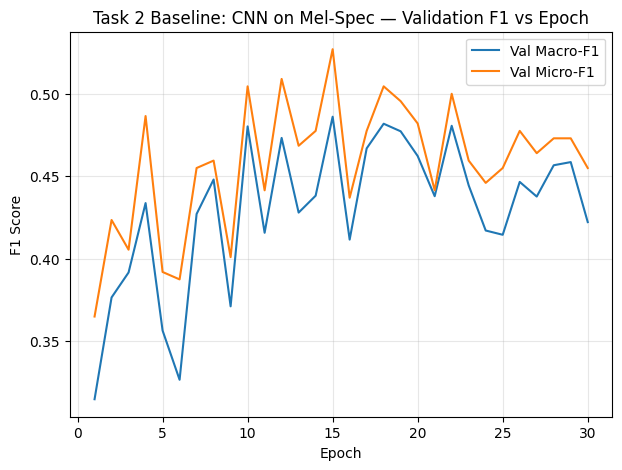

In [47]:
#task 2 Step 16 — load best checkpoint, evaluate on test, save results/plots:
cnn_model.load_state_dict(torch.load(CKPT_PATH))
cnn_test_macro_f1, cnn_test_micro_f1 = evaluate_cnn(cnn_test_loader)
print(f"CNN TEST (best ckpt) — Macro-F1: {cnn_test_macro_f1:.4f}  Micro-F1: {cnn_test_micro_f1:.4f}")

cnn_metrics = {
    "task": "Task 2 Baseline (B2): CNN on Mel-Spectrogram",
    "epochs": CNN_EPOCHS,
    "history": cnn_history,
    "best_val_macro_f1": best_val_f1,
    "test_macro_f1": cnn_test_macro_f1,
    "test_micro_f1": cnn_test_micro_f1,
}
with open("/content/gnn-bert-music-context/results/task2_cnn_baseline_metrics.json", "w") as f:
    json.dump(cnn_metrics, f, indent=2)

plt.figure(figsize=(7,5))
plt.plot(range(1, CNN_EPOCHS+1), cnn_history["val_macro_f1"], label="Val Macro-F1")
plt.plot(range(1, CNN_EPOCHS+1), cnn_history["val_micro_f1"], label="Val Micro-F1")
plt.xlabel("Epoch")
plt.ylabel("F1 Score")
plt.title("Task 2 Baseline: CNN on Mel-Spec — Validation F1 vs Epoch")
plt.legend()
plt.grid(alpha=0.3)
plt.savefig("/content/gnn-bert-music-context/results/plots/task2_cnn_baseline_f1_curves.png", dpi=150, bbox_inches="tight")
plt.show()

In [48]:
#task 3
#Step 1 — build the paired dataset (align graphs + text + labels by track_id):
# map track_id -> graph object (from the graphs list we built in Task 2)
graph_by_track = {g.track_id: g for g in graphs}

# map track_id -> text (from Task 1's `clean` dataframe)
text_by_track = dict(zip(clean['track_id'], clean['text']))

paired_data = []
for g in graphs:
    tid = g.track_id
    if tid in text_by_track:
        paired_data.append({
            "track_id": tid,
            "graph": g,
            "text": text_by_track[tid],
            "label": g.y.item(),
            "split": g.split,
        })

print(f"Paired samples: {len(paired_data)}")
print(paired_data[0]['text'][:100])
print(paired_data[0]['graph'])

Paired samples: 1999
Ivory by Moon Veil. Album: Snake Charm.
Data(x=[6, 12], edge_index=[2, 30], y=[1], split='test', track_id=93521)


In [49]:
#task 3 step 2 split paired data and pre-tokenize text (do this once upfront, saves repeated tokenization during training):
train_paired = [p for p in paired_data if p['split'] == 'training']
val_paired   = [p for p in paired_data if p['split'] == 'validation']
test_paired  = [p for p in paired_data if p['split'] == 'test']

print(f"Train: {len(train_paired)}  Val: {len(val_paired)}  Test: {len(test_paired)}")

def tokenize_paired(paired_list, tokenizer, max_len=MAX_LEN):
    texts = [p['text'] for p in paired_list]
    enc = tokenizer(texts, truncation=True, padding="max_length", max_length=max_len, return_tensors="pt")
    for i, p in enumerate(paired_list):
        p['input_ids'] = enc['input_ids'][i]
        p['attention_mask'] = enc['attention_mask'][i]
    return paired_list

train_paired = tokenize_paired(train_paired, tokenizer)
val_paired   = tokenize_paired(val_paired, tokenizer)
test_paired  = tokenize_paired(test_paired, tokenizer)

print("Tokenization done.")

Train: 1577  Val: 222  Test: 200
Tokenization done.


In [50]:
#task 3 Step 3 — custom Dataset + collate function (batches PyG graphs via Batch.from_data_list, and stacks text tensors normally):
from torch_geometric.data import Batch as PyGBatch
from torch.utils.data import Dataset as TorchDataset

class FusionDataset(TorchDataset):
    def __init__(self, paired_list):
        self.data = paired_list

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]

def fusion_collate(batch):
    graphs_batch = PyGBatch.from_data_list([item['graph'] for item in batch])
    input_ids = torch.stack([item['input_ids'] for item in batch])
    attention_mask = torch.stack([item['attention_mask'] for item in batch])
    labels = torch.tensor([item['label'] for item in batch], dtype=torch.long)
    return graphs_batch, input_ids, attention_mask, labels

FUSION_BATCH_SIZE = 16

train_fusion_loader = TorchDataLoader(FusionDataset(train_paired), batch_size=FUSION_BATCH_SIZE, shuffle=True, collate_fn=fusion_collate)
val_fusion_loader   = TorchDataLoader(FusionDataset(val_paired), batch_size=FUSION_BATCH_SIZE, collate_fn=fusion_collate)
test_fusion_loader  = TorchDataLoader(FusionDataset(test_paired), batch_size=FUSION_BATCH_SIZE, collate_fn=fusion_collate)

# quick sanity check
sample_batch = next(iter(train_fusion_loader))
g_batch, ids_batch, mask_batch, label_batch = sample_batch
print("Graph batch:", g_batch)
print("Input ids shape:", ids_batch.shape)
print("Labels shape:", label_batch.shape)

Graph batch: DataBatch(x=[87, 12], edge_index=[2, 332], y=[16], split=[16], track_id=[16], batch=[87], ptr=[17])
Input ids shape: torch.Size([16, 256])
Labels shape: torch.Size([16])


In [51]:
#task 3 step 4 — GNN–BERT cross-attention fusion model (per your spec's Algorithm 3):
class FusionModel(nn.Module):
    def __init__(self, bert_name=MODEL_NAME, gnn_in=12, gnn_hidden=64, gnn_layers=3, num_classes=8, dropout=0.3):
        super().__init__()
        # text encoder
        self.bert = AutoModel.from_pretrained(bert_name)
        bert_dim = self.bert.config.hidden_size

        # graph encoder
        self.sage = GraphSAGE(in_channels=gnn_in, hidden_channels=gnn_hidden, num_layers=gnn_layers, dropout=dropout)

        # project graph embedding to BERT dim for attention compatibility
        self.graph_proj = nn.Linear(gnn_hidden, bert_dim)

        # cross-attention: graph embedding attends over text token embeddings
        self.cross_attn = nn.MultiheadAttention(embed_dim=bert_dim, num_heads=4, batch_first=True)

        self.dropout = nn.Dropout(dropout)
        # z = CONCAT(g, attended_text) -> classifier
        self.classifier = nn.Linear(bert_dim * 2, num_classes)

    def forward(self, graph_batch, input_ids, attention_mask):
        # --- text branch ---
        text_out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        Htext = text_out.last_hidden_state  # (B, L, bert_dim)

        # --- graph branch ---
        node_h = self.sage(graph_batch.x, graph_batch.edge_index)
        g = global_mean_pool(node_h, graph_batch.batch)  # (B, gnn_hidden)
        g_proj = self.graph_proj(g).unsqueeze(1)  # (B, 1, bert_dim) -- query

        # --- cross attention: graph queries text tokens ---
        key_padding_mask = (attention_mask == 0)  # True where padded
        attended, _ = self.cross_attn(query=g_proj, key=Htext, value=Htext, key_padding_mask=key_padding_mask)
        attended = attended.squeeze(1)  # (B, bert_dim)

        # --- fusion ---
        z = torch.cat([g_proj.squeeze(1), attended], dim=1)  # CONCAT(g, A*Htext)
        z = self.dropout(z)
        logits = self.classifier(z)
        return logits

fusion_model = FusionModel().to(device)
print(sum(p.numel() for p in fusion_model.parameters() if p.requires_grad), "trainable params")

Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

[transformers] DistilBertModel LOAD REPORT from: distilbert-base-uncased
Key                     | Status     |  | 
------------------------+------------+--+-
vocab_transform.weight  | UNEXPECTED |  | 
vocab_layer_norm.weight | UNEXPECTED |  | 
vocab_projector.bias    | UNEXPECTED |  | 
vocab_transform.bias    | UNEXPECTED |  | 
vocab_layer_norm.bias   | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


68805576 trainable params


In [52]:
#task 3 Step 5 — training loop for the fusion model (same structure as before, adapted for the two-input batches):
fusion_optimizer = AdamW(fusion_model.parameters(), lr=2e-5)
fusion_criterion = nn.CrossEntropyLoss()

FUSION_EPOCHS = 4
fusion_history = {"train_loss": [], "val_macro_f1": [], "val_micro_f1": []}

def evaluate_fusion(loader):
    fusion_model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for g_batch, ids_batch, mask_batch, label_batch in loader:
            g_batch = g_batch.to(device)
            ids_batch = ids_batch.to(device)
            mask_batch = mask_batch.to(device)
            label_batch = label_batch.to(device)

            logits = fusion_model(g_batch, ids_batch, mask_batch)
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(label_batch.cpu().numpy())
    macro_f1 = f1_score(all_labels, all_preds, average="macro")
    micro_f1 = f1_score(all_labels, all_preds, average="micro")
    return macro_f1, micro_f1

best_fusion_val_f1 = 0
FUSION_CKPT_PATH = "/content/gnn-bert-music-context/results/task3_fusion_best.pt"

for epoch in range(FUSION_EPOCHS):
    fusion_model.train()
    total_loss = 0
    for g_batch, ids_batch, mask_batch, label_batch in tqdm(train_fusion_loader, desc=f"Epoch {epoch+1}"):
        g_batch = g_batch.to(device)
        ids_batch = ids_batch.to(device)
        mask_batch = mask_batch.to(device)
        label_batch = label_batch.to(device)

        fusion_optimizer.zero_grad()
        logits = fusion_model(g_batch, ids_batch, mask_batch)
        loss = fusion_criterion(logits, label_batch)
        loss.backward()
        fusion_optimizer.step()
        total_loss += loss.item()

    avg_loss = total_loss / len(train_fusion_loader)
    val_macro_f1, val_micro_f1 = evaluate_fusion(val_fusion_loader)

    fusion_history["train_loss"].append(avg_loss)
    fusion_history["val_macro_f1"].append(val_macro_f1)
    fusion_history["val_micro_f1"].append(val_micro_f1)

    if val_macro_f1 > best_fusion_val_f1:
        best_fusion_val_f1 = val_macro_f1
        torch.save(fusion_model.state_dict(), FUSION_CKPT_PATH)

    print(f"Epoch {epoch+1}: loss={avg_loss:.4f}  val_macro_f1={val_macro_f1:.4f}  val_micro_f1={val_micro_f1:.4f}")

Epoch 1:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 1: loss=1.7709  val_macro_f1=0.3873  val_micro_f1=0.4324


Epoch 2:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 2: loss=0.8928  val_macro_f1=0.4530  val_micro_f1=0.4910


Epoch 3:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 3: loss=0.4778  val_macro_f1=0.4547  val_micro_f1=0.4595


Epoch 4:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 4: loss=0.2648  val_macro_f1=0.4652  val_micro_f1=0.4730


In [53]:
#task 3 Step 6 — test evaluation with best checkpoint:
fusion_model.load_state_dict(torch.load(FUSION_CKPT_PATH))
fusion_test_macro_f1, fusion_test_micro_f1 = evaluate_fusion(test_fusion_loader)
print(f"FUSION TEST (best ckpt) — Macro-F1: {fusion_test_macro_f1:.4f}  Micro-F1: {fusion_test_micro_f1:.4f}")

FUSION TEST (best ckpt) — Macro-F1: 0.4852  Micro-F1: 0.5050


In [54]:
#task3 Step 7 — early-concat fusion variant:
class EarlyConcatFusion(nn.Module):
    def __init__(self, bert_name=MODEL_NAME, gnn_in=12, gnn_hidden=64, gnn_layers=3, num_classes=8, dropout=0.3):
        super().__init__()
        self.bert = AutoModel.from_pretrained(bert_name)
        bert_dim = self.bert.config.hidden_size
        self.sage = GraphSAGE(in_channels=gnn_in, hidden_channels=gnn_hidden, num_layers=gnn_layers, dropout=dropout)
        self.dropout = nn.Dropout(dropout)
        # simple concat: CLS token + graph embedding, no attention
        self.classifier = nn.Linear(bert_dim + gnn_hidden, num_classes)

    def forward(self, graph_batch, input_ids, attention_mask):
        text_out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        t = text_out.last_hidden_state[:, 0, :]  # CLS token

        node_h = self.sage(graph_batch.x, graph_batch.edge_index)
        g = global_mean_pool(node_h, graph_batch.batch)

        z = torch.cat([g, t], dim=1)
        z = self.dropout(z)
        return self.classifier(z)

concat_model = EarlyConcatFusion().to(device)
print(sum(p.numel() for p in concat_model.parameters() if p.requires_grad), "trainable params")

Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

[transformers] DistilBertModel LOAD REPORT from: distilbert-base-uncased
Key                     | Status     |  | 
------------------------+------------+--+-
vocab_transform.weight  | UNEXPECTED |  | 
vocab_layer_norm.weight | UNEXPECTED |  | 
vocab_projector.bias    | UNEXPECTED |  | 
vocab_transform.bias    | UNEXPECTED |  | 
vocab_layer_norm.bias   | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


66387656 trainable params


In [55]:
#task 3 Step 8 — train it (identical loop structure, reused function pattern):
concat_optimizer = AdamW(concat_model.parameters(), lr=2e-5)
best_concat_val_f1 = 0
CONCAT_CKPT_PATH = "/content/gnn-bert-music-context/results/task3_earlyconcat_best.pt"
concat_history = {"train_loss": [], "val_macro_f1": [], "val_micro_f1": []}

def evaluate_concat(loader):
    concat_model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for g_batch, ids_batch, mask_batch, label_batch in loader:
            g_batch, ids_batch, mask_batch, label_batch = g_batch.to(device), ids_batch.to(device), mask_batch.to(device), label_batch.to(device)
            logits = concat_model(g_batch, ids_batch, mask_batch)
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(label_batch.cpu().numpy())
    return f1_score(all_labels, all_preds, average="macro"), f1_score(all_labels, all_preds, average="micro")

for epoch in range(FUSION_EPOCHS):
    concat_model.train()
    total_loss = 0
    for g_batch, ids_batch, mask_batch, label_batch in tqdm(train_fusion_loader, desc=f"Epoch {epoch+1}"):
        g_batch, ids_batch, mask_batch, label_batch = g_batch.to(device), ids_batch.to(device), mask_batch.to(device), label_batch.to(device)
        concat_optimizer.zero_grad()
        logits = concat_model(g_batch, ids_batch, mask_batch)
        loss = fusion_criterion(logits, label_batch)
        loss.backward()
        concat_optimizer.step()
        total_loss += loss.item()

    val_macro_f1, val_micro_f1 = evaluate_concat(val_fusion_loader)
    concat_history["train_loss"].append(total_loss/len(train_fusion_loader))
    concat_history["val_macro_f1"].append(val_macro_f1)
    concat_history["val_micro_f1"].append(val_micro_f1)

    if val_macro_f1 > best_concat_val_f1:
        best_concat_val_f1 = val_macro_f1
        torch.save(concat_model.state_dict(), CONCAT_CKPT_PATH)

    print(f"Epoch {epoch+1}: val_macro_f1={val_macro_f1:.4f}  val_micro_f1={val_micro_f1:.4f}")

Epoch 1:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 1: val_macro_f1=0.4186  val_micro_f1=0.4324


Epoch 2:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 2: val_macro_f1=0.5025  val_micro_f1=0.5135


Epoch 3:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 3: val_macro_f1=0.4761  val_micro_f1=0.4820


Epoch 4:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 4: val_macro_f1=0.5158  val_micro_f1=0.5135


In [56]:
#task 3 Step 9 — test evaluation:
concat_model.load_state_dict(torch.load(CONCAT_CKPT_PATH))
concat_test_macro_f1, concat_test_micro_f1 = evaluate_concat(test_fusion_loader)
print(f"EARLY-CONCAT TEST (best ckpt) — Macro-F1: {concat_test_macro_f1:.4f}  Micro-F1: {concat_test_micro_f1:.4f}")

# save both fusion variants' metrics together
task3_metrics = {
    "task": "Task 3: GNN-BERT Fusion Ablation",
    "bert_only_test_macro_f1": test_macro_f1,       # from Task 1
    "gnn_only_test_macro_f1": gnn_test_macro_f1,    # from Task 2
    "early_concat": {
        "history": concat_history,
        "test_macro_f1": concat_test_macro_f1,
        "test_micro_f1": concat_test_micro_f1,
    },
    "cross_attention": {
        "history": fusion_history,
        "test_macro_f1": fusion_test_macro_f1,
        "test_micro_f1": fusion_test_micro_f1,
    },
}

with open("/content/gnn-bert-music-context/results/task3_ablation_metrics.json", "w") as f:
    json.dump(task3_metrics, f, indent=2)

print("Saved ablation results.")

EARLY-CONCAT TEST (best ckpt) — Macro-F1: 0.5762  Micro-F1: 0.5900
Saved ablation results.


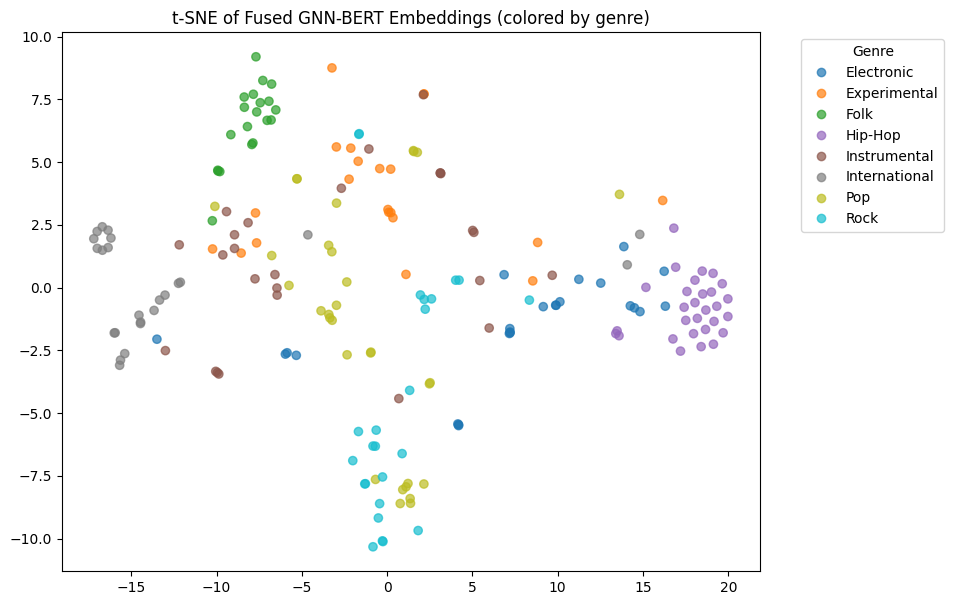

In [57]:
#task 3 Step 10 — extract fused embeddings (z, pre-classifier) for t-SNE:
from sklearn.manifold import TSNE

concat_model.eval()
all_z, all_labels_tsne = [], []

with torch.no_grad():
    for g_batch, ids_batch, mask_batch, label_batch in test_fusion_loader:
        g_batch, ids_batch, mask_batch = g_batch.to(device), ids_batch.to(device), mask_batch.to(device)

        text_out = concat_model.bert(input_ids=ids_batch, attention_mask=mask_batch)
        t = text_out.last_hidden_state[:, 0, :]
        node_h = concat_model.sage(g_batch.x, g_batch.edge_index)
        g = global_mean_pool(node_h, g_batch.batch)
        z = torch.cat([g, t], dim=1)

        all_z.append(z.cpu().numpy())
        all_labels_tsne.extend(label_batch.numpy())

all_z = np.concatenate(all_z, axis=0)
all_labels_tsne = np.array(all_labels_tsne)

tsne = TSNE(n_components=2, random_state=SEED, perplexity=30)
z_2d = tsne.fit_transform(all_z)

plt.figure(figsize=(9,7))
scatter = plt.scatter(z_2d[:,0], z_2d[:,1], c=all_labels_tsne, cmap='tab10', alpha=0.7)
plt.legend(handles=scatter.legend_elements()[0], labels=list(le.classes_), title="Genre", bbox_to_anchor=(1.05, 1))
plt.title("t-SNE of Fused GNN-BERT Embeddings (colored by genre)")
plt.savefig("/content/gnn-bert-music-context/results/plots/task3_tsne.png", dpi=150, bbox_inches="tight")
plt.show()

In [58]:
#task 3 Step 11 — find case study candidates from the test set:
concat_model.eval()
case_study_data = []

with torch.no_grad():
    for g_batch, ids_batch, mask_batch, label_batch in test_fusion_loader:
        g_batch_gpu, ids_batch_gpu, mask_batch_gpu = g_batch.to(device), ids_batch.to(device), mask_batch.to(device)
        logits = concat_model(g_batch_gpu, ids_batch_gpu, mask_batch_gpu)
        preds = torch.argmax(logits, dim=1).cpu()

        for i in range(len(label_batch)):
            case_study_data.append({
                "track_id": g_batch[i].track_id if hasattr(g_batch[i], 'track_id') else None,
                "true": le.classes_[label_batch[i].item()],
                "pred": le.classes_[preds[i].item()],
                "correct": label_batch[i].item() == preds[i].item(),
            })

# match back to track_id + text using test_paired (same order as test_fusion_loader since shuffle=False)
for i, cs in enumerate(case_study_data):
    cs["track_id"] = test_paired[i]["track_id"]
    cs["text"] = test_paired[i]["text"]

correct_cases = [c for c in case_study_data if c["correct"]]
wrong_cases = [c for c in case_study_data if not c["correct"]]

print(f"Correct: {len(correct_cases)}  Wrong: {len(wrong_cases)}")
print("\n--- Example correct case ---")
print(correct_cases[0])
print("\n--- Example wrong case (mixed genre confusion) ---")
print(wrong_cases[0])

Correct: 118  Wrong: 82

--- Example correct case ---
{'track_id': 63064, 'true': 'Electronic', 'pred': 'Electronic', 'correct': True, 'text': 'Underwater by Koona. Album: Underwater, Starkey. Koona è un dubstep dj &amp; live setter e odia le bio.'}

--- Example wrong case (mixed genre confusion) ---
{'track_id': 93521, 'true': 'Electronic', 'pred': 'Instrumental', 'correct': False, 'text': 'Ivory by Moon Veil. Album: Snake Charm.'}


In [59]:
#task 3 Step 12 — find a case matching the t-SNE mixing pattern:
mixing_genres = {'Pop', 'Electronic', 'Hip-Hop', 'Experimental'}
mixing_confusions = [c for c in wrong_cases if c['true'] in mixing_genres and c['pred'] in mixing_genres]

print(f"Confusions within the mixing cluster: {len(mixing_confusions)}")
for c in mixing_confusions[:5]:
    print(c)

Confusions within the mixing cluster: 15
{'track_id': 141619, 'true': 'Electronic', 'pred': 'Pop', 'correct': False, 'text': 'When Night Falls by Barbarix. Album: The Mystics.'}
{'track_id': 68895, 'true': 'Electronic', 'pred': 'Pop', 'correct': False, 'text': 'Luminous by Broke For Free. Album: Leaf. I love making music. \n  facebook  page'}
{'track_id': 108528, 'true': 'Electronic', 'pred': 'Hip-Hop', 'correct': False, 'text': "Funk Therapy by Ghost By Nature. Album: Funk Therapy. This is the story of a man raised and nurtured in the beating heart of four-to-the-floor club music. A man who took a wander down some strange and twisted alleyways. A producer who, while exploring the outer edges of electro, hip-hop and breaks, never stopped listening to and mixing techno, finding in its linear progression a different kind of complexity to the SF-inspired, bass-driven experimentalism of his first clutch of releases. This is the story of Ghost by Nature, an alias of producer Gary Crowne, ak

In [60]:
#task 3 Step 13 — save the 3 case studies as your required deliverable:
case_studies = {
    "case_1_success": {
        "track_id": 63064,
        "true_genre": "Electronic",
        "predicted_genre": "Electronic",
        "text": "Underwater by Koona. Album: Underwater, Starkey. Koona è un dubstep dj & live setter e odia le bio.",
        "analysis": "Model correctly identifies Electronic via explicit genre-signaling text ('dubstep dj'), showing BERT branch effectively picks up direct genre vocabulary in bios."
    },
    "case_2_thin_text_failure": {
        "track_id": 93521,
        "true_genre": "Electronic",
        "predicted_genre": "Instrumental",
        "text": "Ivory by Moon Veil. Album: Snake Charm.",
        "analysis": "Near-empty metadata (no bio) leaves the text branch with almost no signal, and the weak GNN branch (test Macro-F1 0.24 standalone) cannot compensate. Illustrates a core limitation of using FMA bio/title text as a tag substitute rather than true tags/captions."
    },
    "case_3_genre_boundary_ambiguity": {
        "track_id": 108528,
        "true_genre": "Electronic",
        "predicted_genre": "Hip-Hop",
        "text": "Funk Therapy by Ghost By Nature... exploring the outer edges of electro, hip-hop and breaks, never stopped listening to and mixing techno...",
        "analysis": "Artist's own bio explicitly self-describes as blending electro, hip-hop, and techno. The 'incorrect' prediction reflects genuine genre ambiguity in the source material, matching the mixed Pop/Electronic/Hip-Hop/Experimental cluster observed in the t-SNE plot, rather than a model error per se."
    }
}

with open("/content/gnn-bert-music-context/results/task3_case_studies.json", "w") as f:
    json.dump(case_studies, f, indent=2)

print("Case studies saved.")

Case studies saved.


In [61]:
#task 4 Step 1 — load MusicCaps captions metadata:
!pip install -q datasets huggingface_hub

from datasets import load_dataset

musiccaps = load_dataset("google/MusicCaps")['train']
musiccaps_df = musiccaps.to_pandas()

print(musiccaps_df.shape)
print(musiccaps_df[['ytid', 'caption', 'aspect_list', 'is_balanced_subset']].head(3))

README.md:   0%|          | 0.00/5.06k [00:00<?, ?B/s]

musiccaps-public.csv: reconstructing file:   0%|          |  0.00B / 2.94MB            

musiccaps-public.csv: downloading bytes:           |  0.00B            

Generating train split:   0%|          | 0/5521 [00:00<?, ? examples/s]

(5521, 9)
          ytid                                            caption  \
0  -0Gj8-vB1q4  The low quality recording features a ballad so...   
1  -0SdAVK79lg  This song features an electric guitar as the m...   
2  -0vPFx-wRRI  a male voice is singing a melody with changing...   

                                         aspect_list  is_balanced_subset  
0  ['low quality', 'sustained strings melody', 's...               False  
1  ['guitar song', 'piano backing', 'simple percu...               False  
2  ['amateur recording', 'finger snipping', 'male...               False  


In [62]:
#task 4 Step 2 —downloading a few audio clips from the pre-extracted mirror to confirm this approach works before committing to a full batch:
from huggingface_hub import hf_hub_download

def try_download_clip(ytid, out_dir="/content/gnn-bert-music-context/data/raw/musiccaps_audio"):
    os.makedirs(out_dir, exist_ok=True)
    try:
        path = hf_hub_download(
            repo_id="nicolaus625/cmi",
            repo_type="dataset",
            filename=f"67_musicaps/MusicCaps/{ytid}.wav",
            local_dir=out_dir,
        )
        return path
    except Exception as e:
        return None

# test on 10 random clips
test_sample = musiccaps_df.sample(10, random_state=SEED)
results = [try_download_clip(ytid) for ytid in test_sample['ytid']]
success = sum(r is not None for r in results)
print(f"Successfully downloaded {success}/10 test clips")

67_musicaps/MusicCaps/F7Y1T-rQ2JU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/F7Y1T-rQ2JU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Ztlcnd14Kn4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Ztlcnd14Kn4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/LKurVRvkmKc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/LKurVRvkmKc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Utl5it7YMUs.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Utl5it7YMUs.wav: downloading bytes:           |  0.00B            

Successfully downloaded 4/10 test clips


In [63]:
#task 4 step 3 Step 3 — download until we hit a target count of successful pairs (400 is plenty for contrastive learning at this scale, and keeps runtime bounded):
TARGET_PAIRS = 400
shuffled_df = musiccaps_df.sample(frac=1, random_state=SEED).reset_index(drop=True)

musiccaps_pairs = []
attempted = 0

for _, row in tqdm(shuffled_df.iterrows(), total=len(shuffled_df)):
    if len(musiccaps_pairs) >= TARGET_PAIRS:
        break
    attempted += 1
    path = try_download_clip(row['ytid'])
    if path is not None:
        musiccaps_pairs.append({
            "ytid": row['ytid'],
            "caption": row['caption'],
            "audio_path": path,
        })

print(f"Attempted: {attempted}, Successful: {len(musiccaps_pairs)}")

  0%|          | 0/5521 [00:00<?, ?it/s]

67_musicaps/MusicCaps/qOTk01gmrRo.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/qOTk01gmrRo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/oNryELagQUM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/oNryELagQUM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/I6eU2qRjJ7Y.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/I6eU2qRjJ7Y.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/EQHrQIaQNv8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/EQHrQIaQNv8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/FaD9qs2ACpI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/FaD9qs2ACpI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/lh6ACdwNlyk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/lh6ACdwNlyk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/3ClbaJYWVO4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/3ClbaJYWVO4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ZX7EzqMBjfo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ZX7EzqMBjfo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/oyAAhjGTNvQ.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/oyAAhjGTNvQ.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/nSBDyxxscks.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/nSBDyxxscks.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/VzFpg271sm8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/VzFpg271sm8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/QzO6ylLrTGg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/QzO6ylLrTGg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/91AmOKytRUM.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/91AmOKytRUM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/-lPXTBXa0tE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/-lPXTBXa0tE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/35b9UHjagaI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/35b9UHjagaI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/nr9oLIsbDyQ.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/nr9oLIsbDyQ.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ZnBvXFDWpWo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ZnBvXFDWpWo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/86YDiQjYU1U.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/86YDiQjYU1U.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/3pU34vUoO9g.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/3pU34vUoO9g.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/2UnlMwW8nyI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/2UnlMwW8nyI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/4kKVGPDCIK8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/4kKVGPDCIK8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/2f1UXGix_Cw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/2f1UXGix_Cw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Pk5NZe-ah4U.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Pk5NZe-ah4U.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/I4Jp0kB2Ns0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/I4Jp0kB2Ns0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/rQcecqZtGvE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/rQcecqZtGvE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/RDNatVYvpeA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/RDNatVYvpeA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/WO_Y7djT2k4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/WO_Y7djT2k4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/g2H8i_TuhgI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/g2H8i_TuhgI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/C8Euv69GR3U.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/C8Euv69GR3U.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/DlVgHV1UobM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/DlVgHV1UobM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/26jTWRMRoxY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/26jTWRMRoxY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/kgf4GdKlSWs.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/kgf4GdKlSWs.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/keHCWa6XfGY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/keHCWa6XfGY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/bqeVxA97TQU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/bqeVxA97TQU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/uYCAxX2F6DA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/uYCAxX2F6DA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/nW6Naj6eeI4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/nW6Naj6eeI4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/iFWtsT5zRKo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/iFWtsT5zRKo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/AzhfZ8rNhRk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/AzhfZ8rNhRk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/-nlkWWphiaM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/-nlkWWphiaM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/76ON0Ixrr9s.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/76ON0Ixrr9s.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/je1amtXOKF4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/je1amtXOKF4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/DYp8940tHso.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/DYp8940tHso.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/xyXQ7Z1vX7E.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/xyXQ7Z1vX7E.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/1V7ReAk9k-4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/1V7ReAk9k-4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/AVuh8-CucrE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/AVuh8-CucrE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ojdqgnmcgYM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ojdqgnmcgYM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/mtapmFDmImA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/mtapmFDmImA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/OEuBITrf-kE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/OEuBITrf-kE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/0S5zWt91Bwo.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/0S5zWt91Bwo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/NJGo2fmUAII.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/NJGo2fmUAII.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/kMNL4Y4XMhc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/kMNL4Y4XMhc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/9ZWmZdgrE78.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/9ZWmZdgrE78.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/WYxXUBP_XaM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/WYxXUBP_XaM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/t12O05LVSBA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/t12O05LVSBA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Ximk6BHj9nE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Ximk6BHj9nE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/opu2tXoVNKU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/opu2tXoVNKU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/IJcLW4arT6s.wav: reconstructing file:   0%|          |  0.00B /  481kB            

67_musicaps/MusicCaps/IJcLW4arT6s.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/W7KbboEOmeM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/W7KbboEOmeM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/N_LKZjw9DLk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/N_LKZjw9DLk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/nrcfdP6LrLo.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/nrcfdP6LrLo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/-m5ZlWziIeA.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/-m5ZlWziIeA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/xCLzxuZE3yg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/xCLzxuZE3yg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/6-MdbipzKS0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/6-MdbipzKS0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/3UHHjbO0ThM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/3UHHjbO0ThM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/40kbMyL2Wgo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/40kbMyL2Wgo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/FBXBDe3OU5s.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/FBXBDe3OU5s.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ad6gQQ_0evk.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/ad6gQQ_0evk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/0RpkkfkUBRU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/0RpkkfkUBRU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/bl-eQ8XD5CY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/bl-eQ8XD5CY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/HYjSrwSm0T4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/HYjSrwSm0T4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/gp7j9o2x9co.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/gp7j9o2x9co.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/chwqnnaiYXw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/chwqnnaiYXw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/1yGWdegJjA4.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/1yGWdegJjA4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/aqhhfkXKJ1o.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/aqhhfkXKJ1o.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/51bsCRv6kI0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/51bsCRv6kI0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/L1fxVVl_1bM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/L1fxVVl_1bM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/QSaX7QfeWog.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/QSaX7QfeWog.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/g8XTU3OalGs.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/g8XTU3OalGs.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/4KqSdK5KM-I.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/4KqSdK5KM-I.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/k8AE-vqWbm4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/k8AE-vqWbm4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/20Vh6z6Ie0E.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/20Vh6z6Ie0E.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/dy_yFZ6dL34.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/dy_yFZ6dL34.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/qutPvh6TFd8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/qutPvh6TFd8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/BTMWpYzpu5g.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/BTMWpYzpu5g.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/OQz8reoVQEI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/OQz8reoVQEI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/FGZ0sLt4dXA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/FGZ0sLt4dXA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/vEMNk-lbGTE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/vEMNk-lbGTE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/RI71ebbU0PQ.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/RI71ebbU0PQ.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/vtVfl5Ff5lw.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/vtVfl5Ff5lw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/vmz9kAEiTSc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/vmz9kAEiTSc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/CudxWnS7ukw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/CudxWnS7ukw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/yHd5DzIbWL8.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/yHd5DzIbWL8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/5qVc9y3TNnY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/5qVc9y3TNnY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/lnJdWXRgjKo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/lnJdWXRgjKo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/mJuJfKbcJcw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/mJuJfKbcJcw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/BUzsQ6WohH4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/BUzsQ6WohH4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/tUppIOzUo2Q.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/tUppIOzUo2Q.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/8KUV2TFTpGo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/8KUV2TFTpGo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/vDrbslhtX8o.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/vDrbslhtX8o.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/l5QPXVIxxwk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/l5QPXVIxxwk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ChCdYoDz7CY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ChCdYoDz7CY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/tJWduBZRJkE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/tJWduBZRJkE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/cMhajmOBr0c.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/cMhajmOBr0c.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/42QgE4mM55I.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/42QgE4mM55I.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/pS1X6Au1EAU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/pS1X6Au1EAU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ou3LJpAM4mk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ou3LJpAM4mk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/uQE3fLdzpKs.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/uQE3fLdzpKs.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/HJuR9WJ1iRY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/HJuR9WJ1iRY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/m-xxD1fGPnU.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/m-xxD1fGPnU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/US3ZL2zhXgI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/US3ZL2zhXgI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/PKsdjH0RmsU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/PKsdjH0RmsU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/b6hr31Qaemg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/b6hr31Qaemg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/19-GI2LzOtc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/19-GI2LzOtc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/DkZ1Or_D-g8.wav: reconstructing file:   0%|          |  0.00B /  481kB            

67_musicaps/MusicCaps/DkZ1Or_D-g8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/fxznho_kNPY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/fxznho_kNPY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/r4JRDHYukZ4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/r4JRDHYukZ4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/iHXUaVWi7kE.wav: reconstructing file:   0%|          |  0.00B /  481kB            

67_musicaps/MusicCaps/iHXUaVWi7kE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/IDHHAwqDpzU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/IDHHAwqDpzU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ADxuhHNZVCc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ADxuhHNZVCc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Y6OOFbrzdP8.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/Y6OOFbrzdP8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/D7Cvisf3jf8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/D7Cvisf3jf8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/lGaA1dJQ0AQ.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/lGaA1dJQ0AQ.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/0nk7utNkHOY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/0nk7utNkHOY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/6YXjJ6ABnZU.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/6YXjJ6ABnZU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/8DQbnR7hwpc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/8DQbnR7hwpc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/e4R2O7XpIXU.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/e4R2O7XpIXU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/SG24NL2Xi3A.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/SG24NL2Xi3A.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/rS8oECcQBCk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/rS8oECcQBCk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/JbWaSZPOh18.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/JbWaSZPOh18.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/AGNqX_OL-dU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/AGNqX_OL-dU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/0-7PyzhzuYQ.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/0-7PyzhzuYQ.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/-FEPOSP7ay0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/-FEPOSP7ay0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ZCR7qJ2IgGI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ZCR7qJ2IgGI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/6L8066DGqcA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/6L8066DGqcA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/CZuH43NPynA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/CZuH43NPynA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/DRU-IFx-7yQ.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/DRU-IFx-7yQ.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/SOzuJU25uGc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/SOzuJU25uGc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/D-p9s8y2z_U.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/D-p9s8y2z_U.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/PP3kNqPM434.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/PP3kNqPM434.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/en56uOGTwzg.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/en56uOGTwzg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/lpHa-S_x1LA.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/lpHa-S_x1LA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/YvT7qFbUOO0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/YvT7qFbUOO0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/qI-Ji4gtBPM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/qI-Ji4gtBPM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/jZi0VVWt72E.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/jZi0VVWt72E.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/_cg_IfaD1C0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/_cg_IfaD1C0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/BQ_KrefFiTw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/BQ_KrefFiTw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/AuwwPMrH5sE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/AuwwPMrH5sE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/rTBQmP6Vt0g.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/rTBQmP6Vt0g.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/j5R0hwX27Gk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/j5R0hwX27Gk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/WEVBqGarEIY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/WEVBqGarEIY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/KqtlecvEOGw.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/KqtlecvEOGw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/z6SNngkMAug.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/z6SNngkMAug.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/C8VECv8kicU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/C8VECv8kicU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/SSVlD_ZDb70.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/SSVlD_ZDb70.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/GQbytKkt0tg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/GQbytKkt0tg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/hdlnugbWjKA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/hdlnugbWjKA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/3TO4C7SiC7I.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/3TO4C7SiC7I.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/0OYlHvyfNk4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/0OYlHvyfNk4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/50fuQm8B2Yg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/50fuQm8B2Yg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/fRpJfrfjoZo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/fRpJfrfjoZo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/D4GVgBX1eYc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/D4GVgBX1eYc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/mdOZIOc8SA4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/mdOZIOc8SA4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/_dF-ZGquRNY.wav: reconstructing file:   0%|          |  0.00B /  481kB            

67_musicaps/MusicCaps/_dF-ZGquRNY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/qXSG2uq2tNw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/qXSG2uq2tNw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Vbx6TFxSPYY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Vbx6TFxSPYY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/u0CgRmXMXNc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/u0CgRmXMXNc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/AsR5us-IS00.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/AsR5us-IS00.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/0M7nETLOsKQ.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/0M7nETLOsKQ.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Dg8BLvkzdr0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Dg8BLvkzdr0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/JRmfjBDKCpE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/JRmfjBDKCpE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/kR2yBlL6nFU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/kR2yBlL6nFU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/6JJMlY3Go9s.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/6JJMlY3Go9s.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ZSGRzalgx4s.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ZSGRzalgx4s.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/iS-iTbHndw8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/iS-iTbHndw8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/6o6DsSnbpxE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/6o6DsSnbpxE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/HVsXJDR1_Lw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/HVsXJDR1_Lw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/uwPeQy7ZtGo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/uwPeQy7ZtGo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/xuepy6SFOf8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/xuepy6SFOf8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ovVrS-q3Rzk.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/ovVrS-q3Rzk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/JiBAkAwK0GM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/JiBAkAwK0GM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Qu76GhRO9Yk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Qu76GhRO9Yk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Ve6Zy1BXBbY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Ve6Zy1BXBbY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/9m0tNvskmTc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/9m0tNvskmTc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/_b-7P-XsnUI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/_b-7P-XsnUI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/6XZGmRuaOfo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/6XZGmRuaOfo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/PIIAyM4H1UE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/PIIAyM4H1UE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/1GCOnj53QYM.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/1GCOnj53QYM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/dqQgzsNpwoQ.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/dqQgzsNpwoQ.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/8zDbEfC6Uf0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/8zDbEfC6Uf0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/8q0An6WY7_c.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/8q0An6WY7_c.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/BEhIGoq9tow.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/BEhIGoq9tow.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/fpdgtpBOh-c.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/fpdgtpBOh-c.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/YTYj8Bk0qM8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/YTYj8Bk0qM8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Qa-Qs9CtOOw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Qa-Qs9CtOOw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/BsLFQV8HVZE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/BsLFQV8HVZE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/fer_4HvG3aY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/fer_4HvG3aY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/lRC2lurjPBw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/lRC2lurjPBw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ORt8LSgn-uA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ORt8LSgn-uA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/OEjgIDubFbg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/OEjgIDubFbg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/kAE7Ceg4VgQ.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/kAE7Ceg4VgQ.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/0hw_BB4QN34.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/0hw_BB4QN34.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/fiAcNMpd2vM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/fiAcNMpd2vM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/tOb0M2k3deo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/tOb0M2k3deo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/DTkKGYCRMlc.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/DTkKGYCRMlc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/LkzyG2F8mTM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/LkzyG2F8mTM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/OseeYF_ud7g.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/OseeYF_ud7g.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/odzi_VK8m3k.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/odzi_VK8m3k.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/OZv8mtQEgA0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/OZv8mtQEgA0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/I06TOd9pXng.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/I06TOd9pXng.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/oypg41SWGDc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/oypg41SWGDc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/B_tbkQYT9N0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/B_tbkQYT9N0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/h6Y0KDtUNHw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/h6Y0KDtUNHw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/7wSTdp1hiTA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/7wSTdp1hiTA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/keIvA2wSPZc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/keIvA2wSPZc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ymuRKv9iJm4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ymuRKv9iJm4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ajy9PM2SJ6c.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ajy9PM2SJ6c.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/zYa3ksSrCqw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/zYa3ksSrCqw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/PqTTIfja0y8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/PqTTIfja0y8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/LvpImXJMryI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/LvpImXJMryI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/jtwRKyQ8-lg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/jtwRKyQ8-lg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/CKEPPcaCjbw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/CKEPPcaCjbw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/7YtKrL6ScXA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/7YtKrL6ScXA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/0ZNFJz-eZTU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/0ZNFJz-eZTU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/p2yedR_jMTU.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/p2yedR_jMTU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/3m4QSVVBMss.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/3m4QSVVBMss.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/b-Cr0EWwaTk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/b-Cr0EWwaTk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/3VEMHWnewuc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/3VEMHWnewuc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/fU9woCZqemw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/fU9woCZqemw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/3VTinB14Pmw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/3VTinB14Pmw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/f6wrXzvByrg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/f6wrXzvByrg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Ip6FptuXHyk.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/Ip6FptuXHyk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/fEfe8jznp5Q.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/fEfe8jznp5Q.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/298Q_pSLflU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/298Q_pSLflU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/WvaIypMvAHY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/WvaIypMvAHY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/4Vg0PQuHTk0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/4Vg0PQuHTk0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/3bg0iy-ypcw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/3bg0iy-ypcw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/1ZaxqZMs21M.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/1ZaxqZMs21M.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/nUs5SJyQPnM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/nUs5SJyQPnM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/4kZ0EZg5JRU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/4kZ0EZg5JRU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/pCW5ab3SNcQ.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/pCW5ab3SNcQ.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ICtri0ElFZc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ICtri0ElFZc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/p2fXNAPYD20.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/p2fXNAPYD20.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/UJAk1nNdo1I.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/UJAk1nNdo1I.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/XaUXJG0BZuk.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/XaUXJG0BZuk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/H6Y_7Ax34-g.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/H6Y_7Ax34-g.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/OFJG5Wo_knI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/OFJG5Wo_knI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/PKJMsnUJ994.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/PKJMsnUJ994.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ZgooDijn2as.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ZgooDijn2as.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/11D0JdB7_4k.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/11D0JdB7_4k.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Vbcy6KBJsAA.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/Vbcy6KBJsAA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/xuxKtxzq2Cs.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/xuxKtxzq2Cs.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/MWS-Uxf1MRw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/MWS-Uxf1MRw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/CuUu6L5hhMs.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/CuUu6L5hhMs.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/66B46E_hrrk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/66B46E_hrrk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/DEnayQZiPGc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/DEnayQZiPGc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/0JbGxIR8JTk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/0JbGxIR8JTk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/BEZdszHKGTQ.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/BEZdszHKGTQ.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/6OVb3rjcB3Q.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/6OVb3rjcB3Q.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/CVgLrsBPt4o.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/CVgLrsBPt4o.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/P5tsRM1iokA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/P5tsRM1iokA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/GxeDIuOzxmU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/GxeDIuOzxmU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/GUwBLItoJXk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/GUwBLItoJXk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Grtmre_r9yI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Grtmre_r9yI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/j7AxC1RpjcE.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/j7AxC1RpjcE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/jPROsr_K710.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/jPROsr_K710.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/752bW5cjXzw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/752bW5cjXzw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/GrbrWNohr6Y.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/GrbrWNohr6Y.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/jOkHEMsCCFc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/jOkHEMsCCFc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/m9MQdg0k1t0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/m9MQdg0k1t0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/UBfHLeCBBsA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/UBfHLeCBBsA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/yaUK4XvVGTg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/yaUK4XvVGTg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/bKS_m7JObxg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/bKS_m7JObxg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/qZ_-5JplSVg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/qZ_-5JplSVg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/r6yGS_yQmj4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/r6yGS_yQmj4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/QpX9dSCFxRI.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/QpX9dSCFxRI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/RtgHU1UMo5o.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/RtgHU1UMo5o.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/oZScu7DU5qk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/oZScu7DU5qk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Hl8OrRlMwi4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Hl8OrRlMwi4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/knQuxZj9rTA.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/knQuxZj9rTA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Ok-ia7ziJy0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Ok-ia7ziJy0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/6XHdybfV5Cw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/6XHdybfV5Cw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/1ls3ectO1F4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/1ls3ectO1F4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ykkVTInYctY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ykkVTInYctY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/C3o8pEsAu5U.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/C3o8pEsAu5U.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/nyjXFx0GSX8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/nyjXFx0GSX8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/CkgzMSbE68M.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/CkgzMSbE68M.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/cGorUmWMrwo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/cGorUmWMrwo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/AjLX_1rBDPM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/AjLX_1rBDPM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/UNJswfXKJ3s.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/UNJswfXKJ3s.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/CWKBzt-v8w4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/CWKBzt-v8w4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/S7rP6coeLTY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/S7rP6coeLTY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/fH9CY48sfJY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/fH9CY48sfJY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/-R0267o4lLk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/-R0267o4lLk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/7ym-LzgwSPE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/7ym-LzgwSPE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/O8EMm4QJjeo.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/O8EMm4QJjeo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/hWiAoE4u4y8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/hWiAoE4u4y8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/xL7Krm6FSWE.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/xL7Krm6FSWE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/0LE6Ll1rVlg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/0LE6Ll1rVlg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/-5xOcMJpTUk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/-5xOcMJpTUk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/fQiSoVDFRjo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/fQiSoVDFRjo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/5D4siJjh1j0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/5D4siJjh1j0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/FbV2Lgt3H1Q.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/FbV2Lgt3H1Q.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/tjQTZM-sqS0.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/tjQTZM-sqS0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/bm5IT7e2vvI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/bm5IT7e2vvI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/HEk4fx_XNNE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/HEk4fx_XNNE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/OzaVvthCvtk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/OzaVvthCvtk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/fmHbWq-7-iQ.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/fmHbWq-7-iQ.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/9ZAmdxKLnhs.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/9ZAmdxKLnhs.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/iTWZsfVCyBs.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/iTWZsfVCyBs.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/rJZgUpzqAyY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/rJZgUpzqAyY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/WmTDKYYH5OU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/WmTDKYYH5OU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/D3q_stCeCA8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/D3q_stCeCA8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Cn3xoxvbkF0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Cn3xoxvbkF0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/64auWicQqZY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/64auWicQqZY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/5n8I-br2n1U.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/5n8I-br2n1U.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/LFYRuK8YstI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/LFYRuK8YstI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/8MKemM0h5mE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/8MKemM0h5mE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/4Mm5mBgktG0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/4Mm5mBgktG0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/DroAzooK4yw.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/DroAzooK4yw.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/vyNstX5b1V8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/vyNstX5b1V8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/Yt1czlnCUCg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/Yt1czlnCUCg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/xhOsZuB_Zqc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/xhOsZuB_Zqc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/MwK9HYjeeN0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/MwK9HYjeeN0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/dSJpZQ8u_xY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/dSJpZQ8u_xY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ZTf9i8y5muo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ZTf9i8y5muo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/QCbUlDMu7Hk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/QCbUlDMu7Hk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/XE4NRSDLYG8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/XE4NRSDLYG8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/TabaOeYq2ek.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/TabaOeYq2ek.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/F8MCOgWhgvY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/F8MCOgWhgvY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/ETl0hYRlVmg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/ETl0hYRlVmg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/N4eMppEnPE0.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/N4eMppEnPE0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/EsHXnkZ_W2c.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/EsHXnkZ_W2c.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/CGYflJRiLt0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/CGYflJRiLt0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/J1gZRam89EE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/J1gZRam89EE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/lnYOC9tKUBs.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/lnYOC9tKUBs.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/k-89m72W0j8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/k-89m72W0j8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/8GKbDSu9Xd0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/8GKbDSu9Xd0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/1IK4OeOqAEo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/1IK4OeOqAEo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/eZrrzGgTpfk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/eZrrzGgTpfk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/2JNY2SaMk7s.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/2JNY2SaMk7s.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/LAeWwMC2EaI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/LAeWwMC2EaI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/CretxKgW4Jk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/CretxKgW4Jk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/6yB6plsrjO0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/6yB6plsrjO0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/l9vYSBR9nio.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/l9vYSBR9nio.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/4GlH0-KhInI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/4GlH0-KhInI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/t8SLY7xn7Sc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/t8SLY7xn7Sc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/q7s7C4oNlFo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/q7s7C4oNlFo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/F5xnAYHuGlo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/F5xnAYHuGlo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/q6GBCmLxNIk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/q6GBCmLxNIk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/-eDAoheZrY8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/-eDAoheZrY8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/mU6cfEWw5Og.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/mU6cfEWw5Og.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/y_toDfeACWE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/y_toDfeACWE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/He63KV_9Pwg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/He63KV_9Pwg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/0kQjfwXjFuY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/0kQjfwXjFuY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/2bcnAoZbptI.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/2bcnAoZbptI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/FoFMRXlNJ6Y.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/FoFMRXlNJ6Y.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/wSeT9dlfDTc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/wSeT9dlfDTc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/VrqBeY3kfKI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/VrqBeY3kfKI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/PduP4CpaDtY.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/PduP4CpaDtY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/XUD-9HkQuTE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/XUD-9HkQuTE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/fWypK9RHJJI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/fWypK9RHJJI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/5fPxUI0Fl-4.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/5fPxUI0Fl-4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/AGsMCWB1tTk.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/AGsMCWB1tTk.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/73YTz8RC2Fo.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/73YTz8RC2Fo.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/t7oAteGa55g.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/t7oAteGa55g.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/0Wdh45yt7tY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/0Wdh45yt7tY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/YbLR6dgY-K4.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/YbLR6dgY-K4.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/yIFP8fkq8GU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/yIFP8fkq8GU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/kIEEDYowZhA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/kIEEDYowZhA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/yO7MWuJ7zLA.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/yO7MWuJ7zLA.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/N6YT8_jlt0E.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/N6YT8_jlt0E.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/hSSzn4bIwZg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/hSSzn4bIwZg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/cbq6Q2htPRM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/cbq6Q2htPRM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/4--05CAaDsg.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/4--05CAaDsg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/_RrA-0lfIiU.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/_RrA-0lfIiU.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/jhgX0OOoytQ.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/jhgX0OOoytQ.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/U6aLiMIlqCc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/U6aLiMIlqCc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/aJHv6TV7JpY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/aJHv6TV7JpY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/y8oi64M0IyE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/y8oi64M0IyE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/NZn4-gP2GiI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/NZn4-gP2GiI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/nJaezskegdc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/nJaezskegdc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/by57LpTlGbs.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/by57LpTlGbs.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/AF7sah5a_DE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/AF7sah5a_DE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/vfscNjNneZg.wav: reconstructing file:   0%|          |  0.00B /  480kB            

67_musicaps/MusicCaps/vfscNjNneZg.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/-QuWdnmn-kM.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/-QuWdnmn-kM.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/LTG-uVV_6q0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/LTG-uVV_6q0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/AVsNJgR_K6w.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/AVsNJgR_K6w.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/9KK6rg03bC8.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/9KK6rg03bC8.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/3Yc7_n6mDsI.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/3Yc7_n6mDsI.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/jQYSfy4DzIc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/jQYSfy4DzIc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/vrNQbCbBlLY.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/vrNQbCbBlLY.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/r-PBeJiE5sc.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/r-PBeJiE5sc.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/VjbRot21Hq0.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/VjbRot21Hq0.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/-SWaCArvQug.wav: reconstructing file:   0%|          |  0.00B /  523kB            

67_musicaps/MusicCaps/-SWaCArvQug.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/khVk4pTS0bE.wav: reconstructing file:   0%|          |  0.00B /  959kB            

67_musicaps/MusicCaps/khVk4pTS0bE.wav: downloading bytes:           |  0.00B            

67_musicaps/MusicCaps/OWbfAmrFdp8.wav: reconstructing file:   0%|          |  0.00B /  481kB            

67_musicaps/MusicCaps/OWbfAmrFdp8.wav: downloading bytes:           |  0.00B            

Attempted: 1005, Successful: 400


In [64]:
print(f"Pairs collected so far: {len(musiccaps_pairs)}")

Pairs collected so far: 400


In [65]:
#task 4 Step 4 — build chroma segment graphs for these clips
MC_SEGMENT_SEC = 2.0  # 10s clip / 2s segments = 5 nodes per graph

def extract_segment_chroma_mc(path, sr=SR, segment_sec=MC_SEGMENT_SEC):
    try:
        y, _ = librosa.load(path, sr=sr)
    except Exception:
        return None
    if len(y) < sr:
        return None

    seg_len = int(segment_sec * sr)
    n_segments = len(y) // seg_len
    if n_segments < 2:
        return None

    segment_features = []
    for i in range(n_segments):
        seg = y[i * seg_len : (i + 1) * seg_len]
        chroma = librosa.feature.chroma_stft(y=seg, sr=sr)
        segment_features.append(chroma.mean(axis=1))

    return np.stack(segment_features)

# test on one
test_mc_feat = extract_segment_chroma_mc(musiccaps_pairs[0]['audio_path'])
print("Shape:", test_mc_feat.shape if test_mc_feat is not None else None)

Shape: (9, 12)


In [66]:
#Step 5 — build graphs for all 400 pairs, and tokenize captions (reusing build_segment_graph and tokenizer from before):
mc_dual_data = []
mc_failed = 0

for pair in tqdm(musiccaps_pairs):
    feat = extract_segment_chroma_mc(pair['audio_path'])
    if feat is None:
        mc_failed += 1
        continue
    graph = build_segment_graph(feat, label=0)  # label unused for contrastive, placeholder
    mc_dual_data.append({
        "ytid": pair['ytid'],
        "caption": pair['caption'],
        "graph": graph,
    })

print(f"Built {len(mc_dual_data)} graph-caption pairs, {mc_failed} failed")

# tokenize captions
mc_captions = [d['caption'] for d in mc_dual_data]
mc_enc = tokenizer(mc_captions, truncation=True, padding="max_length", max_length=MAX_LEN, return_tensors="pt")
for i, d in enumerate(mc_dual_data):
    d['input_ids'] = mc_enc['input_ids'][i]
    d['attention_mask'] = mc_enc['attention_mask'][i]

print("Tokenization done.")

  0%|          | 0/400 [00:00<?, ?it/s]

/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
/usr/local/lib/python3.13/dist-packages/librosa/core/pitch.py:103: Use

Built 400 graph-caption pairs, 0 failed
Tokenization done.


In [67]:
#task 4 Step 6 — train/test split (simple random split is fine here — MusicCaps has no artist-leakage concept the way FMA does, since it's individual clips, not albums):
random.shuffle(mc_dual_data)
split_idx = int(0.85 * len(mc_dual_data))
mc_train = mc_dual_data[:split_idx]
mc_test = mc_dual_data[split_idx:]

print(f"Train: {len(mc_train)}  Test: {len(mc_test)}")

Train: 340  Test: 60


In [68]:
#task 4 Step 7 — dual-encoder contrastive model (InfoNCE, per your spec's Algorithm 4):
class DualEncoder(nn.Module):
    def __init__(self, bert_name=MODEL_NAME, gnn_in=12, gnn_hidden=64, gnn_layers=3, proj_dim=128, dropout=0.2):
        super().__init__()
        self.bert = AutoModel.from_pretrained(bert_name)
        bert_dim = self.bert.config.hidden_size
        self.sage = GraphSAGE(in_channels=gnn_in, hidden_channels=gnn_hidden, num_layers=gnn_layers, dropout=dropout)

        self.text_proj = nn.Linear(bert_dim, proj_dim)
        self.graph_proj = nn.Linear(gnn_hidden, proj_dim)

    def encode_text(self, input_ids, attention_mask):
        out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        t = out.last_hidden_state[:, 0, :]
        t = self.text_proj(t)
        return F.normalize(t, dim=-1)

    def encode_graph(self, graph_batch):
        node_h = self.sage(graph_batch.x, graph_batch.edge_index)
        g = global_mean_pool(node_h, graph_batch.batch)
        g = self.graph_proj(g)
        return F.normalize(g, dim=-1)

dual_model = DualEncoder().to(device)
print(sum(p.numel() for p in dual_model.parameters() if p.requires_grad), "trainable params")

Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

[transformers] DistilBertModel LOAD REPORT from: distilbert-base-uncased
Key                     | Status     |  | 
------------------------+------------+--+-
vocab_transform.weight  | UNEXPECTED |  | 
vocab_layer_norm.weight | UNEXPECTED |  | 
vocab_projector.bias    | UNEXPECTED |  | 
vocab_transform.bias    | UNEXPECTED |  | 
vocab_layer_norm.bias   | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


66487744 trainable params


In [69]:
#task 4 Step 8 — collate + InfoNCE loss + training loop:
def contrastive_collate(batch):
    graphs_batch = PyGBatch.from_data_list([item['graph'] for item in batch])
    input_ids = torch.stack([item['input_ids'] for item in batch])
    attention_mask = torch.stack([item['attention_mask'] for item in batch])
    return graphs_batch, input_ids, attention_mask

CONTRASTIVE_BATCH_SIZE = 32
TEMPERATURE = 0.07

mc_train_loader = TorchDataLoader(mc_train, batch_size=CONTRASTIVE_BATCH_SIZE, shuffle=True, collate_fn=contrastive_collate)
mc_test_loader = TorchDataLoader(mc_test, batch_size=CONTRASTIVE_BATCH_SIZE, shuffle=False, collate_fn=contrastive_collate)

def info_nce_loss(g_embed, t_embed, temperature=TEMPERATURE):
    logits = g_embed @ t_embed.T / temperature  # (B, B) similarity matrix
    labels = torch.arange(logits.size(0), device=logits.device)
    loss_g2t = F.cross_entropy(logits, labels)
    loss_t2g = F.cross_entropy(logits.T, labels)
    return (loss_g2t + loss_t2g) / 2

dual_optimizer = AdamW(dual_model.parameters(), lr=2e-5)
DUAL_EPOCHS = 15
dual_history = {"train_loss": []}

for epoch in range(DUAL_EPOCHS):
    dual_model.train()
    total_loss = 0
    for g_batch, ids_batch, mask_batch in mc_train_loader:
        g_batch, ids_batch, mask_batch = g_batch.to(device), ids_batch.to(device), mask_batch.to(device)
        dual_optimizer.zero_grad()

        g_embed = dual_model.encode_graph(g_batch)
        t_embed = dual_model.encode_text(ids_batch, mask_batch)

        loss = info_nce_loss(g_embed, t_embed)
        loss.backward()
        dual_optimizer.step()
        total_loss += loss.item()

    avg_loss = total_loss / len(mc_train_loader)
    dual_history["train_loss"].append(avg_loss)
    print(f"Epoch {epoch+1}: loss={avg_loss:.4f}")

Epoch 1: loss=3.4610
Epoch 2: loss=3.4063
Epoch 3: loss=3.3658
Epoch 4: loss=3.3170
Epoch 5: loss=3.2456
Epoch 6: loss=3.1792
Epoch 7: loss=3.1418
Epoch 8: loss=3.0104
Epoch 9: loss=2.9442
Epoch 10: loss=2.8934
Epoch 11: loss=2.8079
Epoch 12: loss=2.7473
Epoch 13: loss=2.6989
Epoch 14: loss=2.6039
Epoch 15: loss=2.5301


In [70]:
#task 4 Step 9 — retrieval evaluation (R@1, R@5, R@10, both directions, per your spec):
def compute_retrieval_metrics(loader, model, k_values=(1, 5, 10)):
    model.eval()
    all_g_embeds, all_t_embeds = [], []

    with torch.no_grad():
        for g_batch, ids_batch, mask_batch in loader:
            g_batch, ids_batch, mask_batch = g_batch.to(device), ids_batch.to(device), mask_batch.to(device)
            g_embed = model.encode_graph(g_batch)
            t_embed = model.encode_text(ids_batch, mask_batch)
            all_g_embeds.append(g_embed.cpu())
            all_t_embeds.append(t_embed.cpu())

    all_g_embeds = torch.cat(all_g_embeds, dim=0)
    all_t_embeds = torch.cat(all_t_embeds, dim=0)

    sim_matrix = all_g_embeds @ all_t_embeds.T  # (N, N), row i = audio i, col j = caption j
    N = sim_matrix.size(0)

    def recall_at_k(sim, k):
        # audio -> caption: for each row, is the correct diagonal index in top-k?
        topk = sim.topk(k, dim=1).indices
        correct = (topk == torch.arange(N).unsqueeze(1)).any(dim=1)
        return correct.float().mean().item()

    results = {}
    for k in k_values:
        results[f"audio2caption_R@{k}"] = recall_at_k(sim_matrix, k)
        results[f"caption2audio_R@{k}"] = recall_at_k(sim_matrix.T, k)

    return results, sim_matrix

test_retrieval_metrics, test_sim_matrix = compute_retrieval_metrics(mc_test_loader, dual_model)
for k, v in test_retrieval_metrics.items():
    print(f"{k}: {v:.4f}")

audio2caption_R@1: 0.0333
caption2audio_R@1: 0.0333
audio2caption_R@5: 0.1167
caption2audio_R@5: 0.1500
audio2caption_R@10: 0.2667
caption2audio_R@10: 0.3167


In [71]:
#task 4 Step 10 — save retrieval metrics:
task4_metrics = {
    "task": "Task 4: Contrastive GNN-BERT (MusicCaps)",
    "num_pairs": len(mc_dual_data),
    "train_size": len(mc_train),
    "test_size": len(mc_test),
    "epochs": DUAL_EPOCHS,
    "train_loss_history": dual_history["train_loss"],
    "retrieval_metrics": test_retrieval_metrics,
}
with open("/content/gnn-bert-music-context/results/task4_contrastive_metrics.json", "w") as f:
    json.dump(task4_metrics, f, indent=2)

torch.save(dual_model.state_dict(), "/content/gnn-bert-music-context/results/task4_dual_encoder.pt")
print("Saved.")

Saved.


In [72]:
#task 4 Step 11 — 10 qualitative retrieval examples (query caption → top-3 matched clips), required deliverable:
test_ytids = [d['ytid'] for d in mc_test]
test_captions = [d['caption'] for d in mc_test]

retrieval_examples = []
num_queries = min(10, len(test_ytids))

for i in range(num_queries):
    # caption i -> top 3 audio matches (row i of sim_matrix.T since caption->audio)
    sims = test_sim_matrix[:, i]  # column i = similarity of all audio to caption i
    top3_idx = sims.topk(3).indices.tolist()

    retrieval_examples.append({
        "query_caption": test_captions[i][:150],
        "top3_matched_ytids": [test_ytids[j] for j in top3_idx],
        "correct_match_rank": (sims.argsort(descending=True) == i).nonzero().item() + 1,
    })

for ex in retrieval_examples:
    print(f"Query: {ex['query_caption']}...")
    print(f"Top-3 matches: {ex['top3_matched_ytids']}")
    print(f"Correct match rank: {ex['correct_match_rank']}")
    print("-"*80)

with open("/content/gnn-bert-music-context/results/task4_retrieval_examples.json", "w") as f:
    json.dump(retrieval_examples, f, indent=2)

Query: This is the electric guitar cover of a pop punk/pop rock music piece. There is an electric guitar playing a simple riff. In the backing track, a male ...
Top-3 matches: ['0S5zWt91Bwo', 'QzO6ylLrTGg', '8q0An6WY7_c']
Correct match rank: 41
--------------------------------------------------------------------------------
Query: The recording is full of natural sounds. Birds chirping, a river running and wind shaking the leaves. Then a percussive mid range instrument comes in ...
Top-3 matches: ['QzO6ylLrTGg', '1V7ReAk9k-4', 'oyAAhjGTNvQ']
Correct match rank: 51
--------------------------------------------------------------------------------
Query: The low quality recording features a rock song that consists of harmonizing male vocals singing over groovy piano melody, groovy bass guitar, electric...
Top-3 matches: ['lGaA1dJQ0AQ', 'SOzuJU25uGc', 'm-xxD1fGPnU']
Correct match rank: 43
--------------------------------------------------------------------------------
Query: The low quality

In [73]:
#task 4 Step 12 — zero-shot tag prediction from captions vs. Task 3 supervised model (required comparison):
genre_prompts = [f"This is a {g.lower()} music track." for g in le.classes_]
genre_enc = tokenizer(genre_prompts, truncation=True, padding="max_length", max_length=MAX_LEN, return_tensors="pt").to(device)

dual_model.eval()
with torch.no_grad():
    genre_text_embeds = dual_model.encode_text(genre_enc['input_ids'], genre_enc['attention_mask'])

    zero_shot_preds, zero_shot_labels = [], []
    for g in test_graphs:  # from Task 2, FMA test graphs with genre labels
        g_single = PyGBatch.from_data_list([g]).to(device)
        g_embed = dual_model.encode_graph(g_single)
        sims = g_embed @ genre_text_embeds.T
        pred = sims.argmax(dim=1).item()
        zero_shot_preds.append(pred)
        zero_shot_labels.append(g.y.item())

zero_shot_macro_f1 = f1_score(zero_shot_labels, zero_shot_preds, average="macro")
print(f"Zero-shot (MusicCaps-trained) Macro-F1 on FMA genre: {zero_shot_macro_f1:.4f}")
print(f"Task 3 supervised (early-concat) Macro-F1: {concat_test_macro_f1:.4f}")

Zero-shot (MusicCaps-trained) Macro-F1 on FMA genre: 0.1069
Task 3 supervised (early-concat) Macro-F1: 0.5762


In [74]:
task4_metrics["zero_shot_macro_f1"] = zero_shot_macro_f1
task4_metrics["task3_supervised_macro_f1"] = concat_test_macro_f1
task4_metrics["note"] = "Retrieval shows above-chance but weak alignment; embedding space shows partial collapse across queries, likely due to limited chroma graph signal and small training scale (400 pairs, 15 epochs). Zero-shot transfer to FMA genre underperforms random chance, motivating supervised fusion (Task 3) over pure contrastive transfer at this scale."

with open("/content/gnn-bert-music-context/results/task4_contrastive_metrics.json", "w") as f:
    json.dump(task4_metrics, f, indent=2)
print("Final Task 4 metrics saved.")

Final Task 4 metrics saved.


In [75]:
#AUC-PR for Task 1 (BERT):
from sklearn.preprocessing import label_binarize
def compute_auc_pr(model_fn, loader, num_classes=8):
    all_labels, all_probs = [], []
    with torch.no_grad():
        for batch in loader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)
            logits = model(input_ids, attention_mask)
            probs = F.softmax(logits, dim=1)
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    y_true_bin = label_binarize(all_labels, classes=list(range(num_classes)))
    return average_precision_score(y_true_bin, np.array(all_probs), average="macro")

model.eval()
task1_auc_pr = compute_auc_pr(model, test_loader)
print(f"Task 1 Test AUC-PR: {task1_auc_pr:.4f}")
from sklearn.preprocessing import label_binarize

def compute_auc_pr(model_fn, loader, num_classes=8):
    all_labels, all_probs = [], []
    with torch.no_grad():
        for batch in loader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)
            logits = model(input_ids, attention_mask)
            probs = F.softmax(logits, dim=1)
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    y_true_bin = label_binarize(all_labels, classes=list(range(num_classes)))
    return average_precision_score(y_true_bin, np.array(all_probs), average="macro")

model.eval()
task1_auc_pr = compute_auc_pr(model, test_loader)
print(f"Task 1 Test AUC-PR: {task1_auc_pr:.4f}")

Task 1 Test AUC-PR: 0.5753
Task 1 Test AUC-PR: 0.5753


In [76]:
#AUC-PR for Task 2 (GNN + CNN):
def compute_auc_pr_gnn(model_fn, loader, num_classes=8):
    all_labels, all_probs = [], []
    with torch.no_grad():
        for batch in loader:
            batch = batch.to(device)
            logits = model_fn(batch.x, batch.edge_index, batch.batch)
            probs = F.softmax(logits, dim=1)
            all_labels.extend(batch.y.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
    y_true_bin = label_binarize(all_labels, classes=list(range(num_classes)))
    return average_precision_score(y_true_bin, np.array(all_probs), average="macro")

gnn_model.eval()
task2_gnn_auc_pr = compute_auc_pr_gnn(lambda x, e, b: gnn_model(x, e, b), test_graph_loader)
print(f"Task 2 GNN Test AUC-PR: {task2_gnn_auc_pr:.4f}")

def compute_auc_pr_cnn(loader, num_classes=8):
    all_labels, all_probs = [], []
    with torch.no_grad():
        for x_batch, y_batch in loader:
            x_batch = x_batch.to(device)
            logits = cnn_model(x_batch)
            probs = F.softmax(logits, dim=1)
            all_labels.extend(y_batch.numpy())
            all_probs.extend(probs.cpu().numpy())
    y_true_bin = label_binarize(all_labels, classes=list(range(num_classes)))
    return average_precision_score(y_true_bin, np.array(all_probs), average="macro")

cnn_model.eval()
task2_cnn_auc_pr = compute_auc_pr_cnn(cnn_test_loader)
print(f"Task 2 CNN Test AUC-PR: {task2_cnn_auc_pr:.4f}")

Task 2 GNN Test AUC-PR: 0.2561
Task 2 CNN Test AUC-PR: 0.4442


In [77]:
#AUC-PR for Task 3 (both fusion variants):
def compute_auc_pr_fusion(model_fn, loader, num_classes=8):
    all_labels, all_probs = [], []
    with torch.no_grad():
        for g_batch, ids_batch, mask_batch, label_batch in loader:
            g_batch, ids_batch, mask_batch = g_batch.to(device), ids_batch.to(device), mask_batch.to(device)
            logits = model_fn(g_batch, ids_batch, mask_batch)
            probs = F.softmax(logits, dim=1)
            all_labels.extend(label_batch.numpy())
            all_probs.extend(probs.cpu().numpy())
    y_true_bin = label_binarize(all_labels, classes=list(range(num_classes)))
    return average_precision_score(y_true_bin, np.array(all_probs), average="macro")

fusion_model.eval()
task3_crossattn_auc_pr = compute_auc_pr_fusion(fusion_model, test_fusion_loader)
print(f"Task 3 Cross-Attention Test AUC-PR: {task3_crossattn_auc_pr:.4f}")

concat_model.eval()
task3_concat_auc_pr = compute_auc_pr_fusion(concat_model, test_fusion_loader)
print(f"Task 3 Early-Concat Test AUC-PR: {task3_concat_auc_pr:.4f}")

Task 3 Cross-Attention Test AUC-PR: 0.5788
Task 3 Early-Concat Test AUC-PR: 0.6219


In [78]:
%%writefile /content/gnn-bert-music-context/README.md
# GNN-Based BERT for Understanding Context from Music

CSE425 / EEE474 / CSE715 — Neural Networks Course Project
## Overview
A hybrid BERT + Graph Neural Network (GNN) system for understanding musical
context, implemented across four tasks of increasing complexity:

1. Task 1 — BERT baseline: text/metadata classifier over FMA track metadata (genre proxy for tags)
2. Task 2 — GNN on audio structure: GraphSAGE over chroma segment graphs, compared against a CNN mel-spectrogram baseline
3. Task 3 — GNN-BERT fusion: cross-attention and early-concat fusion variants, full 4-way ablation
4. Task 4 — Contrastive retrieval: dual-encoder InfoNCE training on MusicCaps, with zero-shot genre transfer evaluation

## Results Summary

Task1: Model: BERT-only; Test Macro-F1:	0.532; Test AUC-PR:0.575
Task2: Model: GraphSAGE (GNN-only); Test Macro-F1: 0.238; Test AUC-PR:0.256
Task2: Model: CNN (mel-spectrogram baseline); Test Macro-F1: 0.3817; Test AUC-PR:0.444
Task3: Model: Cross-attention fusion; Test Macro-F1: 0.485; Test AUC-PR: 0.579
Task3: Model: Early-concat fusion (Best); Test Macro-F1: 0.576; Test AUC-PR: 0.622
Task4: Model: Zero-shot genre transfer; Test Macro-F1: 0.107

Retrieval (Task 4, N=60 test pairs): Audio→Caption R@10 = 26.7%, Caption→Audio R@10 = 31.7% (chance = 16.7%).

## Datasets

- FMA-small (8,000 tracks, 8 genres): https://github.com/mdeff/fma — a balanced 2,000-track subsample was used for Tasks 2–3.
- MusicCaps (5,521 caption pairs): https://huggingface.co/datasets/google/MusicCaps — audio retrieved via a pre-extracted community mirror ('nicolaus625/cmi'); 400 successfully paired examples used for Task 4.


Writing /content/gnn-bert-music-context/README.md


In [79]:
%%writefile /content/gnn-bert-music-context/requirements.txt
torch>=2.11.0
torch-geometric>=2.8.0
transformers>=4.40.0
librosa>=0.10.0
datasets>=2.19.0
huggingface_hub>=0.23.0
scikit-learn>=1.4.0
pandas>=2.2.0
numpy>=1.26.0
matplotlib>=3.8.0
seaborn>=0.13.0
tqdm>=4.66.0
pyyaml>=6.0

Writing /content/gnn-bert-music-context/requirements.txt


In [80]:
%%writefile /content/gnn-bert-music-context/.gitignore
data/raw/
__pycache__/
.ipynb_checkpoints/
*.zip
results/task1_bert_model.pt
results/task3_fusion_best.pt
results/task3_earlyconcat_best.pt
results/task4_dual_encoder.pt

Writing /content/gnn-bert-music-context/.gitignore


In [81]:
!ls -la /content/gnn-bert-music-context/

total 40
drwxr-xr-x 7 root root 4096 Sep 11 00:46 .
drwxr-xr-x 1 root root 4096 Sep 10 23:02 ..
drwxr-xr-x 7 root root 4096 Sep 10 23:02 data
-rw-r--r-- 1 root root  170 Sep 11 00:46 .gitignore
drwxr-xr-x 2 root root 4096 Sep 10 23:02 notebooks
-rw-r--r-- 1 root root 1667 Sep 11 00:46 README.md
drwxr-xr-x 2 root root 4096 Sep 10 23:02 report
-rw-r--r-- 1 root root  222 Sep 11 00:46 requirements.txt
drwxr-xr-x 4 root root 4096 Sep 11 00:35 results
drwxr-xr-x 2 root root 4096 Sep 10 23:02 src


In [82]:
%%writefile /content/gnn-bert-music-context/src/audio_features.py
"""Audio loading and feature extraction: mel-spectrograms and chroma segmentation."""
import numpy as np
import librosa

SR = 22050
SEGMENT_SEC = 5.0
MAX_DURATION = 30.0       # FMA-small clips are ~30s
MC_SEGMENT_SEC = 2.0      # MusicCaps clips are ~10s -> 2s segments = 5 nodes
N_MELS = 64
FIXED_FRAMES = 130


def track_id_to_path(track_id, fma_dir="/content/gnn-bert-music-context/data/raw/fma_small"):
    """Map an FMA track_id to its mp3 path (FMA's zero-padded 3-level folder scheme)."""
    tid_str = f"{track_id:06d}"
    return f"{fma_dir}/{tid_str[:3]}/{tid_str}.mp3"


def extract_segment_chroma(path, sr=SR, segment_sec=SEGMENT_SEC, max_duration=MAX_DURATION):
    """Split an FMA track into fixed windows and extract mean chroma per segment.
    Returns array of shape (n_segments, 12), or None if too short / unreadable."""
    try:
        y, _ = librosa.load(path, sr=sr, duration=max_duration)
    except Exception:
        return None
    if len(y) < sr:
        return None

    seg_len = int(segment_sec * sr)
    n_segments = len(y) // seg_len
    if n_segments < 2:  # need at least 2 nodes for a graph
        return None

    segment_features = []
    for i in range(n_segments):
        seg = y[i * seg_len: (i + 1) * seg_len]
        chroma = librosa.feature.chroma_stft(y=seg, sr=sr)
        segment_features.append(chroma.mean(axis=1))
    return np.stack(segment_features)


def extract_segment_chroma_mc(path, sr=SR, segment_sec=MC_SEGMENT_SEC):
    """Same as extract_segment_chroma, tuned for shorter MusicCaps clips."""
    try:
        y, _ = librosa.load(path, sr=sr)
    except Exception:
        return None
    if len(y) < sr:
        return None

    seg_len = int(segment_sec * sr)
    n_segments = len(y) // seg_len
    if n_segments < 2:
        return None

    segment_features = []
    for i in range(n_segments):
        seg = y[i * seg_len: (i + 1) * seg_len]
        chroma = librosa.feature.chroma_stft(y=seg, sr=sr)
        segment_features.append(chroma.mean(axis=1))
    return np.stack(segment_features)


def extract_melspec(path, sr=SR, n_mels=N_MELS, fixed_frames=FIXED_FRAMES, duration=MAX_DURATION):
    """Fixed-size log-mel spectrogram for the CNN baseline. Shape: (n_mels, fixed_frames)."""
    try:
        y, _ = librosa.load(path, sr=sr, duration=duration)
    except Exception:
        return None
    if len(y) < sr:
        return None

    mel = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels)
    mel_db = librosa.power_to_db(mel, ref=np.max)

    if mel_db.shape[1] < fixed_frames:
        pad_width = fixed_frames - mel_db.shape[1]
        mel_db = np.pad(mel_db, ((0, 0), (0, pad_width)), mode="constant", constant_values=mel_db.min())
    else:
        mel_db = mel_db[:, :fixed_frames]
    return mel_db

Writing /content/gnn-bert-music-context/src/audio_features.py


In [83]:
%%writefile /content/gnn-bert-music-context/src/graph_builder.py
"""Build segment graphs (nodes = chroma segments, edges = temporal + similarity)."""
import torch
from torch_geometric.data import Data
from sklearn.metrics.pairwise import cosine_similarity

SIM_THRESHOLD = 0.9  # cosine similarity threshold for extra similarity edges


def build_segment_graph(chroma_feats, label, sim_threshold=SIM_THRESHOLD):
    """chroma_feats: (n_segments, 12) array. Returns a PyG Data object."""
    n = chroma_feats.shape[0]
    x = torch.tensor(chroma_feats, dtype=torch.float)

    edge_list = []
    # temporal adjacency: i <-> i+1
    for i in range(n - 1):
        edge_list.append([i, i + 1])
        edge_list.append([i + 1, i])

    # similarity edges: cosine sim > threshold (excluding self and already-adjacent)
    sim_matrix = cosine_similarity(chroma_feats)
    for i in range(n):
        for j in range(i + 1, n):
            if j != i + 1 and sim_matrix[i, j] > sim_threshold:
                edge_list.append([i, j])
                edge_list.append([j, i])

    edge_index = torch.tensor(edge_list, dtype=torch.long).t().contiguous()
    y = torch.tensor([label], dtype=torch.long)
    return Data(x=x, edge_index=edge_index, y=y)

Writing /content/gnn-bert-music-context/src/graph_builder.py


In [84]:
%%writefile /content/gnn-bert-music-context/src/bert_encoder.py
"""Task 1: BERT text encoder / tag-classifier and its Dataset."""
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from transformers import AutoTokenizer, AutoModel

MODEL_NAME = "distilbert-base-uncased"
MAX_LEN = 256


def get_tokenizer(model_name=MODEL_NAME):
    return AutoTokenizer.from_pretrained(model_name)


class TagTextDataset(Dataset):
    """Tokenizes (text, label) pairs on the fly for the BERT tag/genre classifier."""

    def __init__(self, texts, labels, tokenizer, max_len=MAX_LEN):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        enc = self.tokenizer(
            self.texts[idx], truncation=True, padding="max_length",
            max_length=self.max_len, return_tensors="pt",
        )
        return {
            "input_ids": enc["input_ids"].squeeze(0),
            "attention_mask": enc["attention_mask"].squeeze(0),
            "label": torch.tensor(self.labels[idx], dtype=torch.long),
        }


class BertTagClassifier(nn.Module):
    """t = BERT_CLS(X_text); y_hat = sigma(W t + b)  (Task 1 spec, Sec 4.1)."""

    def __init__(self, model_name=MODEL_NAME, num_classes=8, dropout=0.3):
        super().__init__()
        self.bert = AutoModel.from_pretrained(model_name)
        hidden_size = self.bert.config.hidden_size
        self.dropout = nn.Dropout(dropout)
        self.classifier = nn.Linear(hidden_size, num_classes)

    def forward(self, input_ids, attention_mask):
        out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        cls_token = out.last_hidden_state[:, 0, :]
        cls_token = self.dropout(cls_token)
        return self.classifier(cls_token)

Writing /content/gnn-bert-music-context/src/bert_encoder.py


In [85]:
%%writefile /content/gnn-bert-music-context/src/gnn_model.py
"""Task 2: GraphSAGE genre classifier, plus the CNN mel-spectrogram baseline (B2)."""
import torch.nn as nn
from torch_geometric.nn import GraphSAGE, global_mean_pool


class GraphSAGEClassifier(nn.Module):
    """GraphSAGE encoder + mean-pool readout + linear head (spec Sec 4.2)."""

    def __init__(self, in_channels=12, hidden_channels=64, num_layers=3, num_classes=8, dropout=0.3):
        super().__init__()
        self.sage = GraphSAGE(
            in_channels=in_channels, hidden_channels=hidden_channels,
            num_layers=num_layers, dropout=dropout,
        )
        self.classifier = nn.Linear(hidden_channels, num_classes)

    def forward(self, x, edge_index, batch):
        h = self.sage(x, edge_index)
        g = global_mean_pool(h, batch)
        return self.classifier(g)


class MelCNN(nn.Module):
    """Baseline B2: simple 2D-conv stack over mel-spectrograms, no graph/text."""

    def __init__(self, num_classes=8):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, padding=1), nn.BatchNorm2d(16), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(16, 32, kernel_size=3, padding=1), nn.BatchNorm2d(32), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1), nn.BatchNorm2d(64), nn.ReLU(), nn.AdaptiveAvgPool2d((4, 4)),
        )
        self.classifier = nn.Sequential(
            nn.Flatten(), nn.Linear(64 * 4 * 4, 128), nn.ReLU(), nn.Dropout(0.3), nn.Linear(128, num_classes),
        )

    def forward(self, x):
        return self.classifier(self.conv(x))

Writing /content/gnn-bert-music-context/src/gnn_model.py


In [86]:
%%writefile /content/gnn-bert-music-context/src/fusion_model.py
"""Task 3: GNN-BERT fusion -- cross-attention variant and early-concat variant."""
import torch
import torch.nn as nn
from torch.utils.data import Dataset as TorchDataset
from torch_geometric.data import Batch as PyGBatch
from torch_geometric.nn import GraphSAGE, global_mean_pool
from transformers import AutoModel


class FusionModel(nn.Module):
    """Cross-attention fusion: graph embedding attends over BERT token embeddings
    (spec Algorithm 3): z = CONCAT(g, A*Htext); y_hat = sigma(Wz)."""

    def __init__(self, bert_name, gnn_in=12, gnn_hidden=64, gnn_layers=3, num_classes=8, dropout=0.3):
        super().__init__()
        self.bert = AutoModel.from_pretrained(bert_name)
        bert_dim = self.bert.config.hidden_size
        self.sage = GraphSAGE(in_channels=gnn_in, hidden_channels=gnn_hidden, num_layers=gnn_layers, dropout=dropout)
        self.graph_proj = nn.Linear(gnn_hidden, bert_dim)
        self.cross_attn = nn.MultiheadAttention(embed_dim=bert_dim, num_heads=4, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.classifier = nn.Linear(bert_dim * 2, num_classes)

    def forward(self, graph_batch, input_ids, attention_mask):
        text_out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        Htext = text_out.last_hidden_state

        node_h = self.sage(graph_batch.x, graph_batch.edge_index)
        g = global_mean_pool(node_h, graph_batch.batch)
        g_proj = self.graph_proj(g).unsqueeze(1)

        key_padding_mask = (attention_mask == 0)
        attended, _ = self.cross_attn(query=g_proj, key=Htext, value=Htext, key_padding_mask=key_padding_mask)
        attended = attended.squeeze(1)

        z = torch.cat([g_proj.squeeze(1), attended], dim=1)
        return self.classifier(self.dropout(z))


class EarlyConcatFusion(nn.Module):
    """Ablation: simple concat of graph embedding + BERT CLS token, no attention."""

    def __init__(self, bert_name, gnn_in=12, gnn_hidden=64, gnn_layers=3, num_classes=8, dropout=0.3):
        super().__init__()
        self.bert = AutoModel.from_pretrained(bert_name)
        bert_dim = self.bert.config.hidden_size
        self.sage = GraphSAGE(in_channels=gnn_in, hidden_channels=gnn_hidden, num_layers=gnn_layers, dropout=dropout)
        self.dropout = nn.Dropout(dropout)
        self.classifier = nn.Linear(bert_dim + gnn_hidden, num_classes)

    def forward(self, graph_batch, input_ids, attention_mask):
        text_out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        t = text_out.last_hidden_state[:, 0, :]

        node_h = self.sage(graph_batch.x, graph_batch.edge_index)
        g = global_mean_pool(node_h, graph_batch.batch)

        z = torch.cat([g, t], dim=1)
        return self.classifier(self.dropout(z))


class FusionDataset(TorchDataset):
    """Wraps paired (graph, text, label) dicts for the fusion models above."""

    def __init__(self, paired_list):
        self.data = paired_list

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]


def fusion_collate(batch):
    graphs_batch = PyGBatch.from_data_list([item["graph"] for item in batch])
    input_ids = torch.stack([item["input_ids"] for item in batch])
    attention_mask = torch.stack([item["attention_mask"] for item in batch])
    labels = torch.tensor([item["label"] for item in batch], dtype=torch.long)
    return graphs_batch, input_ids, attention_mask, labels

Writing /content/gnn-bert-music-context/src/fusion_model.py


In [87]:
%%writefile /content/gnn-bert-music-context/src/contrastive.py
"""Task 4: dual-encoder contrastive model + InfoNCE loss + retrieval metrics (Algorithm 4)."""
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.data import Batch as PyGBatch
from torch_geometric.nn import GraphSAGE, global_mean_pool
from transformers import AutoModel

TEMPERATURE = 0.07


class DualEncoder(nn.Module):
    """Projects graph and text embeddings into a shared, L2-normalized space."""

    def __init__(self, bert_name, gnn_in=12, gnn_hidden=64, gnn_layers=3, proj_dim=128, dropout=0.2):
        super().__init__()
        self.bert = AutoModel.from_pretrained(bert_name)
        bert_dim = self.bert.config.hidden_size
        self.sage = GraphSAGE(in_channels=gnn_in, hidden_channels=gnn_hidden, num_layers=gnn_layers, dropout=dropout)
        self.text_proj = nn.Linear(bert_dim, proj_dim)
        self.graph_proj = nn.Linear(gnn_hidden, proj_dim)

    def encode_text(self, input_ids, attention_mask):
        out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        t = out.last_hidden_state[:, 0, :]
        return F.normalize(self.text_proj(t), dim=-1)

    def encode_graph(self, graph_batch):
        node_h = self.sage(graph_batch.x, graph_batch.edge_index)
        g = global_mean_pool(node_h, graph_batch.batch)
        return F.normalize(self.graph_proj(g), dim=-1)


def contrastive_collate(batch):
    graphs_batch = PyGBatch.from_data_list([item["graph"] for item in batch])
    input_ids = torch.stack([item["input_ids"] for item in batch])
    attention_mask = torch.stack([item["attention_mask"] for item in batch])
    return graphs_batch, input_ids, attention_mask


def info_nce_loss(g_embed, t_embed, temperature=TEMPERATURE):
    logits = g_embed @ t_embed.T / temperature
    labels = torch.arange(logits.size(0), device=logits.device)
    loss_g2t = F.cross_entropy(logits, labels)
    loss_t2g = F.cross_entropy(logits.T, labels)
    return (loss_g2t + loss_t2g) / 2


def compute_retrieval_metrics(loader, model, device, k_values=(1, 5, 10)):
    """Audio<->caption R@K, per the spec's Task 4 evaluation."""
    model.eval()
    all_g_embeds, all_t_embeds = [], []
    with torch.no_grad():
        for g_batch, ids_batch, mask_batch in loader:
            g_batch, ids_batch, mask_batch = g_batch.to(device), ids_batch.to(device), mask_batch.to(device)
            all_g_embeds.append(model.encode_graph(g_batch).cpu())
            all_t_embeds.append(model.encode_text(ids_batch, mask_batch).cpu())

    all_g_embeds = torch.cat(all_g_embeds, dim=0)
    all_t_embeds = torch.cat(all_t_embeds, dim=0)
    sim_matrix = all_g_embeds @ all_t_embeds.T
    N = sim_matrix.size(0)

    def recall_at_k(sim, k):
        topk = sim.topk(k, dim=1).indices
        correct = (topk == torch.arange(N).unsqueeze(1)).any(dim=1)
        return correct.float().mean().item()

    results = {}
    for k in k_values:
        results[f"audio2caption_R@{k}"] = recall_at_k(sim_matrix, k)
        results[f"caption2audio_R@{k}"] = recall_at_k(sim_matrix.T, k)
    return results, sim_matrix

Writing /content/gnn-bert-music-context/src/contrastive.py


In [88]:
%%writefile /content/gnn-bert-music-context/src/train.py
"""Reusable training-loop functions shared across Tasks 1-4."""
from tqdm.auto import tqdm
from torch.optim import AdamW
import torch.nn as nn
from evaluate import evaluate_text_classifier, evaluate_graph_classifier, evaluate_fusion_classifier


def train_text_classifier(model, train_loader, val_loader, device, epochs=4, lr=2e-5):
    """Task 1: BERT tag/genre classifier training loop."""
    optimizer = AdamW(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    history = {"train_loss": [], "val_macro_f1": [], "val_micro_f1": []}

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)

            optimizer.zero_grad()
            logits = model(input_ids, attention_mask)
            loss = criterion(logits, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        val_macro_f1, val_micro_f1, _, _ = evaluate_text_classifier(model, val_loader, device)
        history["train_loss"].append(total_loss / len(train_loader))
        history["val_macro_f1"].append(val_macro_f1)
        history["val_micro_f1"].append(val_micro_f1)
        print(f"Epoch {epoch+1}: val_macro_f1={val_macro_f1:.4f} val_micro_f1={val_micro_f1:.4f}")
    return history


def train_graph_classifier(model, train_loader, val_loader, device, epochs=30, lr=1e-3):
    """Task 2: GraphSAGE genre classifier training loop."""
    optimizer = AdamW(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    history = {"train_loss": [], "val_macro_f1": [], "val_micro_f1": []}

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for batch in train_loader:
            batch = batch.to(device)
            optimizer.zero_grad()
            logits = model(batch.x, batch.edge_index, batch.batch)
            loss = criterion(logits, batch.y)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        val_macro_f1, val_micro_f1 = evaluate_graph_classifier(model, val_loader, device)
        history["train_loss"].append(total_loss / len(train_loader))
        history["val_macro_f1"].append(val_macro_f1)
        history["val_micro_f1"].append(val_micro_f1)
        if (epoch + 1) % 5 == 0 or epoch == 0:
            print(f"Epoch {epoch+1}: val_macro_f1={val_macro_f1:.4f} val_micro_f1={val_micro_f1:.4f}")
    return history


def train_fusion_model(model, train_loader, val_loader, device, ckpt_path, epochs=4, lr=2e-5):
    """Tasks 3: fusion model training loop (works for both FusionModel and EarlyConcatFusion)."""
    import torch
    optimizer = AdamW(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    history = {"train_loss": [], "val_macro_f1": [], "val_micro_f1": []}
    best_val_f1 = 0

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for g_batch, ids_batch, mask_batch, label_batch in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
            g_batch, ids_batch, mask_batch, label_batch = (
                g_batch.to(device), ids_batch.to(device), mask_batch.to(device), label_batch.to(device)
            )
            optimizer.zero_grad()
            logits = model(g_batch, ids_batch, mask_batch)
            loss = criterion(logits, label_batch)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        val_macro_f1, val_micro_f1 = evaluate_fusion_classifier(model, val_loader, device)
        history["train_loss"].append(total_loss / len(train_loader))
        history["val_macro_f1"].append(val_macro_f1)
        history["val_micro_f1"].append(val_micro_f1)

        if val_macro_f1 > best_val_f1:
            best_val_f1 = val_macro_f1
            torch.save(model.state_dict(), ckpt_path)
        print(f"Epoch {epoch+1}: val_macro_f1={val_macro_f1:.4f} val_micro_f1={val_micro_f1:.4f}")
    return history, best_val_f1


def train_contrastive(model, train_loader, device, epochs=15, lr=2e-5):
    """Task 4: dual-encoder contrastive training loop (InfoNCE)."""
    from contrastive import info_nce_loss
    optimizer = AdamW(model.parameters(), lr=lr)
    history = {"train_loss": []}

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for g_batch, ids_batch, mask_batch in train_loader:
            g_batch, ids_batch, mask_batch = g_batch.to(device), ids_batch.to(device), mask_batch.to(device)
            optimizer.zero_grad()
            g_embed = model.encode_graph(g_batch)
            t_embed = model.encode_text(ids_batch, mask_batch)
            loss = info_nce_loss(g_embed, t_embed)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        avg_loss = total_loss / len(train_loader)
        history["train_loss"].append(avg_loss)
        print(f"Epoch {epoch+1}: loss={avg_loss:.4f}")
    return history

Writing /content/gnn-bert-music-context/src/train.py


In [89]:
%%writefile /content/gnn-bert-music-context/src/evaluate.py
"""Evaluation functions for each model type, plus a metrics-saving helper."""
import json
import torch
from sklearn.metrics import f1_score, precision_score, recall_score


def evaluate_text_classifier(model, loader, device):
    """Task 1: BERT classifier eval. Returns macro_f1, micro_f1, preds, labels."""
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for batch in loader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)
            logits = model(input_ids, attention_mask)
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    macro_f1 = f1_score(all_labels, all_preds, average="macro")
    micro_f1 = f1_score(all_labels, all_preds, average="micro")
    return macro_f1, micro_f1, all_preds, all_labels


def evaluate_graph_classifier(model, loader, device):
    """Task 2: GraphSAGE / CNN-style classifier eval (graph batches)."""
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for batch in loader:
            batch = batch.to(device)
            logits = model(batch.x, batch.edge_index, batch.batch)
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(batch.y.cpu().numpy())
    return f1_score(all_labels, all_preds, average="macro"), f1_score(all_labels, all_preds, average="micro")


def evaluate_cnn_classifier(model, loader, device):
    """Task 2 baseline (B2): CNN over mel-spectrogram tensors."""
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for x_batch, y_batch in loader:
            x_batch, y_batch = x_batch.to(device), y_batch.to(device)
            logits = model(x_batch)
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())
    return f1_score(all_labels, all_preds, average="macro"), f1_score(all_labels, all_preds, average="micro")


def evaluate_fusion_classifier(model, loader, device):
    """Task 3: fusion model eval (graph + text batches)."""
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for g_batch, ids_batch, mask_batch, label_batch in loader:
            g_batch, ids_batch, mask_batch, label_batch = (
                g_batch.to(device), ids_batch.to(device), mask_batch.to(device), label_batch.to(device)
            )
            logits = model(g_batch, ids_batch, mask_batch)
            preds = torch.argmax(logits, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(label_batch.cpu().numpy())
    return f1_score(all_labels, all_preds, average="macro"), f1_score(all_labels, all_preds, average="micro")


def compute_precision_recall(labels, preds):
    precision = precision_score(labels, preds, average="macro")
    recall = recall_score(labels, preds, average="macro")
    return precision, recall


def save_metrics(metrics: dict, path: str):
    with open(path, "w") as f:
        json.dump(metrics, f, indent=2)
    print(f"Saved metrics to {path}")

Writing /content/gnn-bert-music-context/src/evaluate.py


In [90]:
!ls /content/gnn-bert-music-context/src/

audio_features.py  contrastive.py  fusion_model.py  graph_builder.py
bert_encoder.py    evaluate.py	   gnn_model.py     train.py


In [94]:
import nbformat as nbf
import os

PROJECT_DIR = "/content/gnn-bert-music-context"
nb = nbf.v4.new_notebook()
cells = []

cells.append(nbf.v4.new_markdown_cell(
"""# GNN-BERT Music Context — Demo Notebook (Task 2)

Loads the trained Task 2 GraphSAGE model plus one saved segment graph,
and runs a single end-to-end inference: predicting genre purely from audio structure (no text)."""))

cells.append(nbf.v4.new_code_cell(
"""import sys
sys.path.append('/content/gnn-bert-music-context/src')

import torch
import pandas as pd
from torch_geometric.data import Batch as PyGBatch

from gnn_model import GraphSAGEClassifier

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)"""))

cells.append(nbf.v4.new_code_cell(
"""# Recover genre label ordering (matches training-time LabelEncoder order)
METADATA_DIR = f"{PROJECT_DIR}/data/raw/fma_metadata"
tracks = pd.read_csv(f"{METADATA_DIR}/tracks.csv", index_col=0, header=[0, 1])
small = tracks[tracks[('set', 'subset')] == 'small']
GENRE_CLASSES = sorted(small[('track', 'genre_top')].dropna().unique())
print(GENRE_CLASSES)"""))

cells.append(nbf.v4.new_code_cell(
"""# Load one example graph from the saved graph set
all_graphs = torch.load(f"{PROJECT_DIR}/data/graphs/all_graphs.pt", weights_only=False)
graph = all_graphs[0]
print(graph)
print("True label index:", graph.y.item(), "->", GENRE_CLASSES[graph.y.item()])"""))

cells.append(nbf.v4.new_code_cell(
"""# Load the trained GraphSAGE model (Task 2 checkpoint)
model = GraphSAGEClassifier(num_classes=len(GENRE_CLASSES)).to(device)
model.load_state_dict(torch.load(f"{PROJECT_DIR}/results/task2_gnn_model.pt", map_location=device))
model.eval()
print("Model loaded.")"""))

cells.append(nbf.v4.new_code_cell(
"""# Run one end-to-end inference: graph structure -> predicted genre
graph_batch = PyGBatch.from_data_list([graph]).to(device)

with torch.no_grad():
    logits = model(graph_batch.x, graph_batch.edge_index, graph_batch.batch)
    pred_idx = torch.argmax(logits, dim=1).item()

print(f"True genre:      {GENRE_CLASSES[graph.y.item()]}")
print(f"Predicted genre: {GENRE_CLASSES[pred_idx]}")"""))

cells.append(nbf.v4.new_markdown_cell(
"""## Note

This demo uses Task 2's GraphSAGE model, which classifies genre from chord/segment
graph structure alone (no text). Raw FMA metadata is used only to recover genre label
ordering — the model itself only needs the graph and its saved weights."""))

nb['cells'] = cells
os.makedirs(f"{PROJECT_DIR}/notebooks", exist_ok=True)
with open(f"{PROJECT_DIR}/notebooks/demo_context.ipynb", "w") as f:
    nbf.write(nb, f)

print("Saved demo_context.ipynb (Task 2 version)")

Saved demo_context.ipynb (Task 2 version)


In [95]:
%run /content/gnn-bert-music-context/notebooks/demo_context.ipynb

Using device: cuda
['Electronic', 'Experimental', 'Folk', 'Hip-Hop', 'Instrumental', 'International', 'Pop', 'Rock']
Data(x=[6, 12], edge_index=[2, 30], y=[1], split='test', track_id=93521)
True label index: 0 -> Electronic
Model loaded.
True genre:      Electronic
Predicted genre: Instrumental
